# Classifier Analysis
## Preparation
### Import Dependencies

In [1]:
import os
import numpy as np;
import pandas as pd
import matplotlib.pyplot as plt
from scipy import misc
import tensorflow as tf
import seaborn as sns
import tensorflow.contrib.layers as c_layers
#from RL_utils import *

c:\users\vkakerbeck\miniconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
c:\users\vkakerbeck\miniconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
c:\users\vkakerbeck\miniconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
c:\users\vkakerbeck\miniconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:5

Instructions for updating:
Use the retry module or similar alternatives.


### Load Data

In [2]:
folder_name = '3999_16.100'
path = './Results/TowerTraining/'+folder_name+'/'
figure_path = './Results/TowerTraining/NNFigures/'

obs = np.load(path+'visobs.npy', mmap_mode='r')
vec = np.load(path+'vecobs.npy')
encA = np.load(path+'encodings.npy')
val = np.load(path+'values.npy')
actionL = np.load(path+'actions.npy')
rew = np.load(path+'rewards.npy')

doors = np.load(path+'doors.npy')
Rewards = np.load(path+'reward_per.npy')

hand_l = pd.read_csv(path+'HandLabels.csv')
label_test = np.zeros(encA.shape[0])
label_test = np.array(hand_l['Label'])

### Process Data

In [3]:
def addLabel(currL,ToAdd):
    if ToAdd<=1:
        return currL
    elif ToAdd==2:
        currL[0] = 4
    elif ToAdd==3:
        currL[0] = 2
    elif ToAdd==4:
        currL[0] = 3
    elif ToAdd==5:
        currL[0] = 4
    elif ToAdd==6:
        currL[0]=1
    elif ToAdd==7:
        currL[1]=1
    elif ToAdd==8:
        currL[2]=1
    elif ToAdd==9:
        currL[3]=1
    else:
        print(ToAdd)
    return currL

def formatLabels(labels1,labels2):
    formatted = []
    for i,l in enumerate(labels1):
        newLabel=[0,0,0,0]
        if l == 0:
            print(i)
        newLabel = addLabel(newLabel,l)
        #print(str(i)+': '+str(newLabel)+ '  '+str(l))
        newLabel = addLabel(newLabel,labels2[i])
        #print(str(i)+': '+str(newLabel)+ '  '+str(labels2[i]))
        formatted.append(newLabel)
    return np.array(formatted)

fLabels = formatLabels(np.array(hand_l['Label']),np.array(hand_l['Secondary label']))

In [4]:
def ClassToWords(l):
    words = ''
    if l[0]==0:
        words = words + 'No Door   , '
    elif l[0]==1:
        words = words + 'Level Door, '
    elif l[0]==2:
        words = words + 'Green Door, '
    elif l[0]==3:
        words = words + 'Red Door  , '
    elif l[0]==4:
        words = words + 'Other Door, '
    else:
        words = words + '?, '
    
    if l[1]==0:
        words = words + 'No Key, '
    elif l[1]==1:
        words = words + 'Key    , '
    else:
        words = words + '?     , '
    
    if l[2]==0:
        words = words + 'No Orb, '
    elif l[2]==1:
        words = words + 'Orb   , '
    else:
        words = words + '?     , '
    
    if l[3]==0:
        words = words + 'No Puzzle '
    elif l[3]==1:
        words = words + 'Puzzle     '
    else:
        words = words + '?         '
        
    return words
ClassToWords(fLabels[10])

'No Door   , No Key, No Orb, No Puzzle '

### Generate Classifier Activations

In [5]:
tf.reset_default_graph()

def swish(input_activation):
    """Swish activation function. For more info: https://arxiv.org/abs/1710.05941"""
    return tf.multiply(input_activation, tf.nn.sigmoid(input_activation))

o_size_h = 168
o_size_w = 168
vec_obs_size = 8
num_layers = 2
h_size = 256
h_size_vec = 256
            
visual_in = tf.placeholder(shape=[None, o_size_h, o_size_w, 3], dtype=tf.float32,name="visual_observation_0")
labels = tf.placeholder(shape=[None,4], dtype=tf.int64,name="labels")

running_mean = tf.get_variable("running_mean", [vec_obs_size],trainable=False, dtype=tf.float32,initializer=tf.zeros_initializer())
running_variance = tf.get_variable("running_variance", [vec_obs_size],trainable=False,dtype=tf.float32,initializer=tf.ones_initializer())

def create_vector_observation_encoder(observation_input, h_size, activation, num_layers, scope,reuse):
    with tf.variable_scope(scope):
        hidden_vec = observation_input
        for i in range(num_layers):
            hidden_vec = tf.layers.dense(hidden_vec, h_size, activation=activation, reuse=reuse,name="hidden_{}".format(i),kernel_initializer=c_layers.variance_scaling_initializer(1.0))
    return hidden_vec

def create_visual_observation_encoder(image_input, h_size, activation, num_layers, scope,reuse):
    with tf.variable_scope(scope):
        conv1 = tf.layers.conv2d(image_input, 16, kernel_size=[8, 8], strides=[4, 4],activation=tf.nn.elu, reuse=reuse, name="conv_1")
        conv2 = tf.layers.conv2d(conv1, 32, kernel_size=[4, 4], strides=[2, 2],activation=tf.nn.elu, reuse=reuse, name="conv_2")
        hidden_vis = c_layers.flatten(conv2)

    with tf.variable_scope(scope + '/' + 'flat_encoding'):
        hidden_flat = create_vector_observation_encoder(hidden_vis, h_size, activation,num_layers, scope, reuse)
    return hidden_flat

def create_discrete_action_masking_layer(all_logits, action_size):
        """
        Creates a masking layer for the discrete actions
        :param all_logits: The concatenated unnormalized action probabilities for all branches
        :param action_size: A list containing the number of possible actions for each branch
        :return: The action output dimension [batch_size, num_branches] and the concatenated normalized logits
        """
        action_idx = [0] + list(np.cumsum(action_size))
        raw_probs = [all_logits[:, action_idx[i]:action_idx[i + 1]] for i in range(len(action_size))]#split in action branches (size=action_size)
        normalized_probs = [
            tf.divide(raw_probs[k], tf.reduce_sum(raw_probs[k]+ 1.0e-10, axis=1, keepdims=True))
            for k in range(len(action_size))]
        #normalized_probs = raw_probs
        #output = tf.concat([tf.multinomial(tf.log(raw_probs[k]), 1) for k in range(len(action_size))], axis=1)#sample outputs from log probdist
        output = tf.concat([tf.multinomial(tf.nn.log_softmax(raw_probs[k]), 1) for k in range(len(action_size))], axis=1)#sample outputs from log probdist
        
        log_probs = [tf.log(normalized_probs[k] + 1.0e-10) for k in range(len(action_size))]#xx
        log_probs_flat = tf.concat(log_probs, axis=1)
        return output, log_probs_flat, log_probs

visual_encoders = []
hidden_state, hidden_visual = None, None

encoded_visual = create_visual_observation_encoder(visual_in,h_size,swish,num_layers,"main_graph_0_encoder0", False)
visual_encoders.append(encoded_visual)
hidden = tf.concat(visual_encoders, axis=1)

class_size = [5,2,2,2]
policy_branches = []
for size in class_size:
    policy_branches.append(tf.layers.dense(hidden, size, activation=tf.nn.relu, use_bias=False,kernel_initializer=c_layers.variance_scaling_initializer(factor=0.01)))

all_log_probs = tf.concat([branch for branch in policy_branches], axis=1, name="action_probs")

output, normalized_logits_flat, norm_logits = create_discrete_action_masking_layer(all_log_probs, class_size)

output = tf.identity(output)
normalized_logits = tf.identity(normalized_logits_flat, name='action')#has nan in places where prob is negative bc it it log(probs)

comparison = tf.equal(labels, output)

accuracy = tf.reduce_mean(tf.cast(comparison, dtype=tf.float32))

saver = tf.train.Saver()

In [25]:
sess = tf.Session()
init = tf.global_variables_initializer()
sess.run(init)
#saver.restore(sess, "./Results/TowerTraining/Classifier/Model3/model.ckpt")
saver.restore(sess, "./Results/TowerTraining/Classifier/Model7/model.ckpt")
#out,probs,comp,accu,probsO = sess.run([output,norm_logits,comparison,accuracy,all_log_probs], feed_dict = {visual_in: np.zeros((2,168,168,3)), labels: np.zeros((2,4))})

INFO:tensorflow:Restoring parameters from ./Results/TowerTraining/Classifier/Model7/model.ckpt


In [26]:
out,act = sess.run([output,hidden], feed_dict = {visual_in: obs*255})

In [27]:
out

array([[2, 0, 0, 0],
       [3, 0, 0, 0],
       [0, 0, 0, 0],
       ...,
       [4, 0, 0, 1],
       [3, 0, 0, 1],
       [3, 0, 0, 1]], dtype=int64)

In [28]:
np.save(path+'ClassOut.npy',out)
np.save(path+'ClassAct.npy',act)

In [29]:
out = np.load(path+'ClassOut.npy')
act = np.load(path+'ClassAct.npy')

## Training Statistics

In [5]:
model_path = "./Results/TowerTraining/Classifier/Model7/"
accs = np.load(model_path+'Accs.npy')
entro = np.load(model_path+'Entro.npy')
err = np.load(model_path+'Err.npy')
val_accs = np.load(model_path+'ValAcc.npy')

In [7]:
last_save = int(np.where(val_accs == np.max(val_accs))[0])
last_save

187

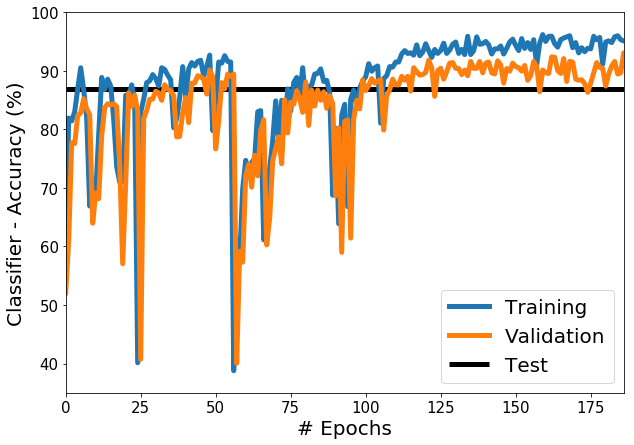

In [59]:
plt.figure(figsize=(10,7))
plt.plot(accs[:last_save],lw=5)
plt.plot(val_accs[1:last_save+2],lw=5)
plt.hlines(np.mean(out==fLabels),0,last_save-1,lw=5)
plt.xlim([0,last_save-1])
plt.ylim([0.35,1])
plt.yticks(np.linspace(0.4,1,7),np.linspace(40,100,7,dtype=int),fontsize=15)
plt.ylabel('Classifier - Accuracy (%)',fontsize=20)
plt.xticks(fontsize=15)
plt.xlabel('# Epochs',fontsize=20)
plt.legend(['Training','Validation','Test'],fontsize=20,loc=4)
#plt.show()
plt.savefig(figure_path+'C_TrainPerf.eps', bbox_inches='tight',dpi=300)

## Example

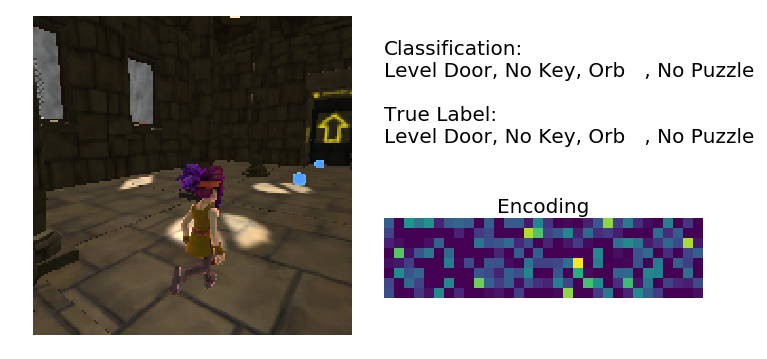

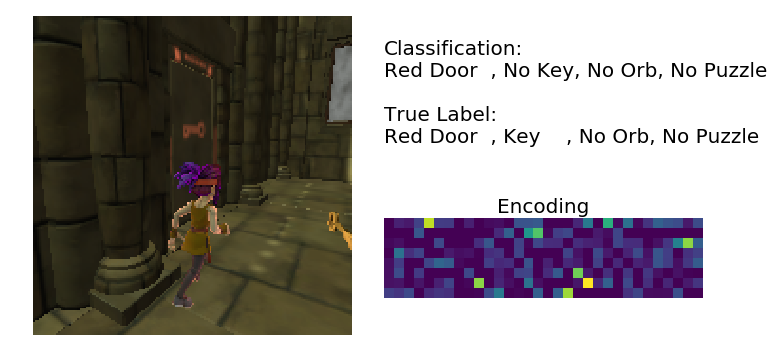

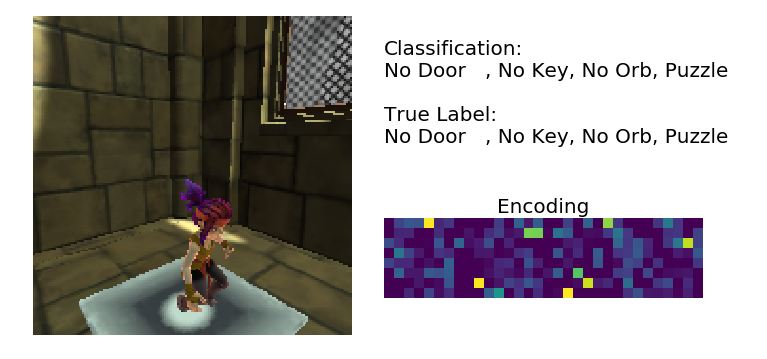

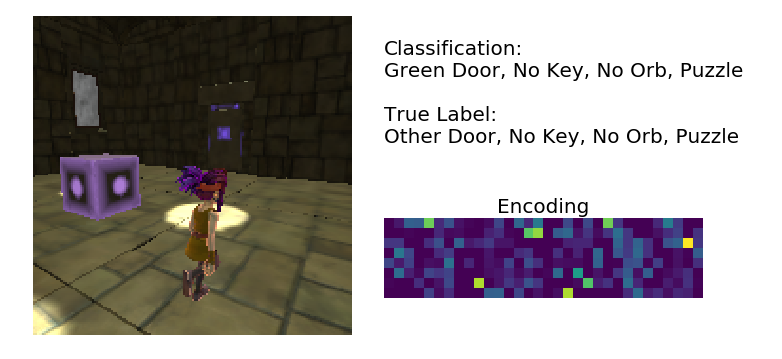

In [60]:
for i in [101,1020,2020,3990]:
    plt.figure(figsize=(12,7))
    plt.subplots_adjust(top=0.78,wspace=0.1,hspace=0.005)
    plt.subplot(1,2,1)
    plt.imshow(obs[i])
    plt.axis('off')
    #plt.title('Input',fontsize=20)
    plt.subplot(2,2,2)
    plt.text(0,0.2,'Classification:\n'+ClassToWords(out[i])+'\n\nTrue Label:\n'+
              ClassToWords(fLabels[i]),fontsize=20)
    plt.axis('off')
    plt.subplot(2,2,4)
    plt.imshow(act[i].reshape((8,32)))
    plt.title('Encoding',fontsize=20)
    plt.axis('off')
    #plt.show()
    plt.savefig(figure_path+'C_Expls/Example'+str(i)+'.eps', bbox_inches='tight')

## Performance

In [61]:
def getFP_FN(o,l):
    w = np.where(l!=o)
    FN = np.sum((o[w]==0)&(l[w]==1))/len(w[0])*100
    FP = np.sum((o[w]>0)&(l[w]==0))/len(w[0])*100
    return np.round(FP,3),np.round(FN,3)

def getAccPR(o,l):
    w = np.where(l!=o)
    trueP = np.sum((o==l)&(o==1))
    trueN = np.sum((o==l)&(o==0))
    falseP = np.sum((o[w]>0)&(l[w]==0))
    falseN = np.sum((o[w]==0)&(l[w]==1))
    Acc = (trueP+trueN)/len(o)*100
    Precision = trueP/(trueP+falseP)*100
    Recall = trueP/(trueP+falseN)*100
    return np.round(Acc,3),np.round(Precision,3),np.round(Recall,3),[trueP,trueN,falseP,falseN]

print('Accuracy: '+str(np.mean(out==fLabels)*100)+'%')
print('Everything correct in '+str(np.sum(np.mean(out==fLabels,axis=1)==1.0)/len(fLabels)*100)+'%')
print('Correct Door in '+str(np.round(np.mean(np.array(fLabels)[:,0]==out[:,0])*100,3))+'%')

#FPND,FNND = getFP_FN((out[:,0]==0).astype(int),(np.array(fLabels)[:,0]==0).astype(int))
AccND,PND,RND,NDA = getAccPR((out[:,0]==0).astype(int),(fLabels[:,0]==0).astype(int))
print('     No Door - Acc: '+str(AccND)+'% Precision: '+str(PND)+'% Recall: '+str(RND)+'%  |  TP,TN,FP,FN: '+str(NDA))

#FPLD,FNLD = getFP_FN((out[:,0]==1).astype(int),(np.array(fLabels)[:,0]==1).astype(int))
AccLD,PLD,RLD,LDA = getAccPR((out[:,0]==1).astype(int),(fLabels[:,0]==1).astype(int))
print('     Level Door - Acc: '+str(AccLD)+'% Precision: '+str(PLD)+'% Recall: '+str(RLD)+'%  |  TP,TN,FP,FN: '+str(LDA))

#FPGD,FNGD = getFP_FN((out[:,0]==2).astype(int),(np.array(fLabels)[:,0]==2).astype(int))
AccGD,PGD,RGD,GDA = getAccPR((out[:,0]==2).astype(int),(fLabels[:,0]==2).astype(int))
print('     Green Door - Acc: '+str(AccGD)+'% Precision: '+str(PGD)+'% Recall: '+str(RGD)+'%  |  TP,TN,FP,FN: '+str(GDA))

#FPRD,FNRD = getFP_FN((out[:,0]==3).astype(int),(np.array(fLabels)[:,0]==3).astype(int))
AccKD,PKD,RKD,KDA = getAccPR((out[:,0]==3).astype(int),(fLabels[:,0]==3).astype(int))
print('     Key Door - Acc: '+str(AccKD)+'% Precision: '+str(PKD)+'% Recall: '+str(RKD)+'%  |  TP,TN,FP,FN: '+str(KDA))

#FPOD,FNOD = getFP_FN((out[:,0]==4).astype(int),(np.array(fLabels)[:,0]==4).astype(int))
AccOD,POD,ROD,ODA = getAccPR((out[:,0]==4).astype(int),(fLabels[:,0]==4).astype(int))
print('     Other Door - Acc: '+str(AccOD)+'% Precision: '+str(POD)+'% Recall: '+str(ROD)+'%  |  TP,TN,FP,FN: '+str(ODA))


#FPK,FNK = getFP_FN(out[:,1],np.array(fLabels)[:,1])
AccK,PK,RK,KA = getAccPR(out[:,1],np.array(fLabels)[:,1])
print('Correct Key in '+str(AccK)+'% - Precision: '+
      str(PK)+'% Recall: '+str(RK)+'%  |  TP,TN,FP,FN: '+str(KA))
#FPO,FNO = getFP_FN(out[:,2],np.array(fLabels)[:,2])
AccO,PO,RO,OA = getAccPR(out[:,2],np.array(fLabels)[:,2])
print('Correct Orb in '+str(AccO)+'% - Precision: '+
      str(PO)+'% Recall: '+str(RO)+'%  |  TP,TN,FP,FN: '+str(OA))
#FPP,FNP = getFP_FN(out[:,3],np.array(fLabels)[:,3])
AccP,PP,RP,PA = getAccPR(out[:,3],np.array(fLabels)[:,3])
print('Correct Puzzle in '+str(AccP)+'% - Precision: '+
      str(PP)+'% Recall: '+str(RP)+'%  |  TP,TN,FP,FN: '+str(PA))

Accuracy: 86.925%
Everything correct in 55.00000000000001%
Correct Door in 61.45%
     No Door - Acc: 78.025% Precision: 86.296% Recall: 68.929%  |  TP,TN,FP,FN: [1442, 1679, 229, 650]
     Level Door - Acc: 96.525% Precision: 58.209% Recall: 85.246%  |  TP,TN,FP,FN: [156, 3705, 112, 27]
     Green Door - Acc: 71.95% Precision: 41.434% Recall: 65.459%  |  TP,TN,FP,FN: [578, 2300, 817, 305]
     Key Door - Acc: 88.75% Precision: 48.036% Recall: 62.85%  |  TP,TN,FP,FN: [269, 3281, 291, 159]
     Other Door - Acc: 87.65% Precision: 12.264% Recall: 3.14%  |  TP,TN,FP,FN: [13, 3493, 93, 401]
Correct Key in 99.15% - Precision: nan% Recall: 0.0%  |  TP,TN,FP,FN: [0, 3966, 0, 34]
Correct Orb in 98.85% - Precision: 88.889% Recall: 95.307%  |  TP,TN,FP,FN: [264, 3690, 33, 13]
Correct Puzzle in 88.25% - Precision: 78.817% Recall: 64.454%  |  TP,TN,FP,FN: [573, 2957, 154, 316]


c:\users\vivia\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in long_scalars
  


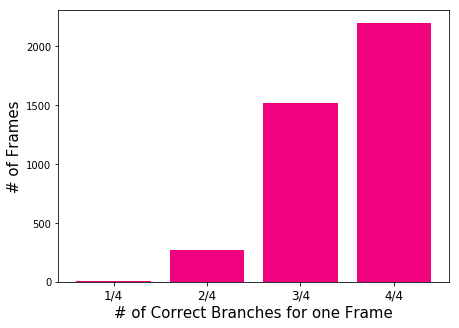

In [62]:
plt.figure(figsize=(7,5))
plt.bar(np.linspace(0,3,4),np.histogram(np.mean(out==fLabels,axis=1),bins=4)[0],color=sns.color_palette("Accent", n_colors=8)[5])
plt.xticks(np.linspace(0,3,4),['1/4','2/4','3/4','4/4'],fontsize=12)
plt.xlabel('# of Correct Branches for one Frame',fontsize=15)
plt.ylabel('# of Frames',fontsize=15)
#plt.plot()
plt.savefig(figure_path+'Classifier_PerformanceDist.eps', bbox_inches='tight',dpi=300)

## Plot Animations


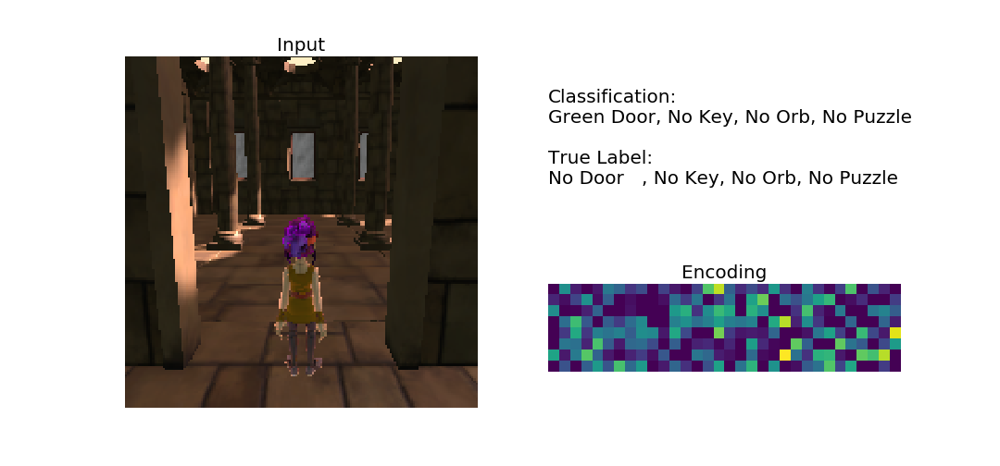
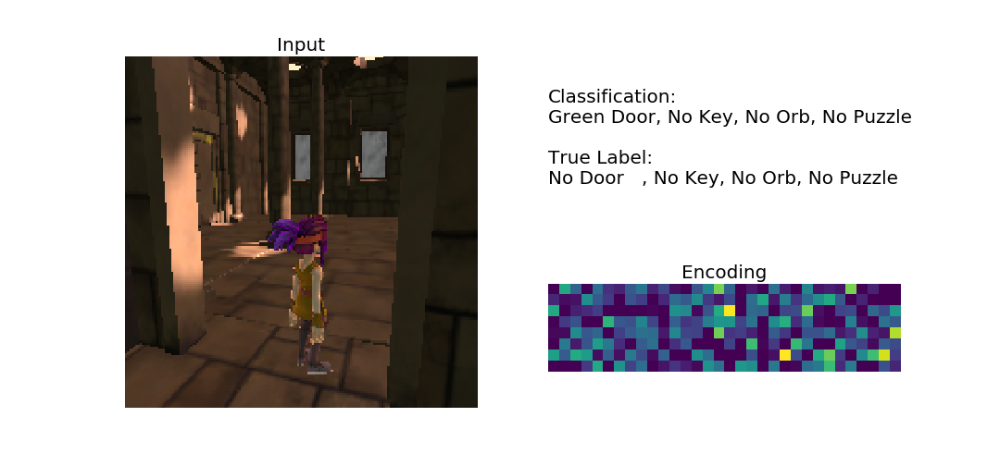
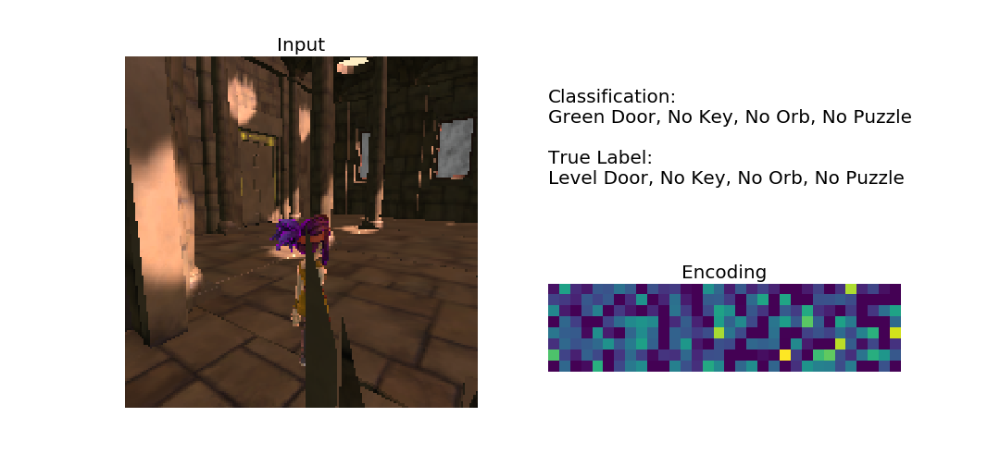
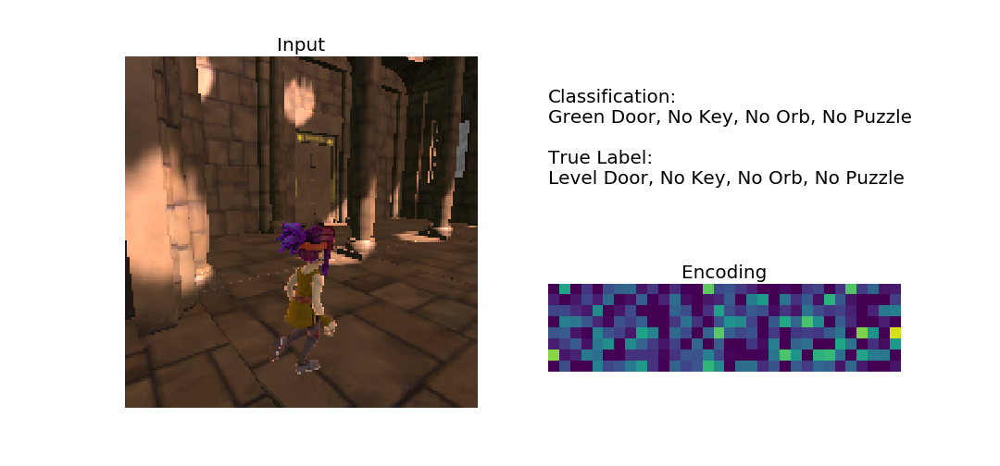
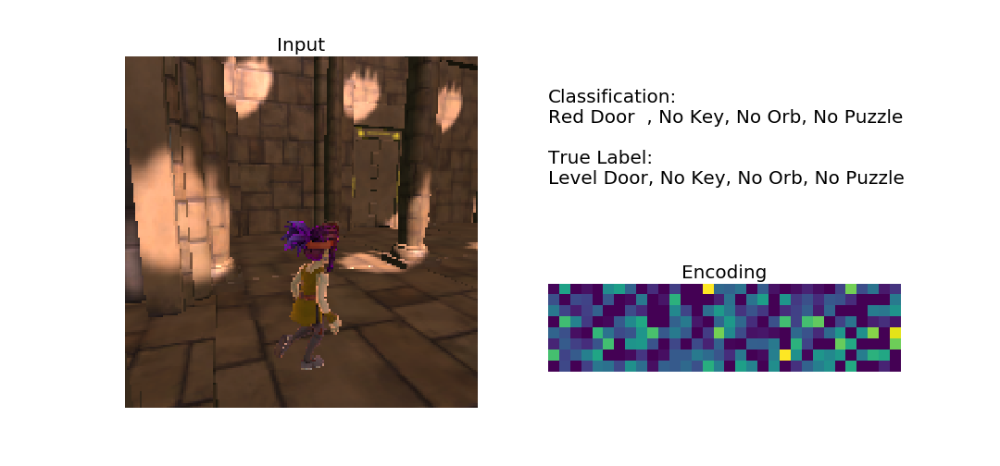
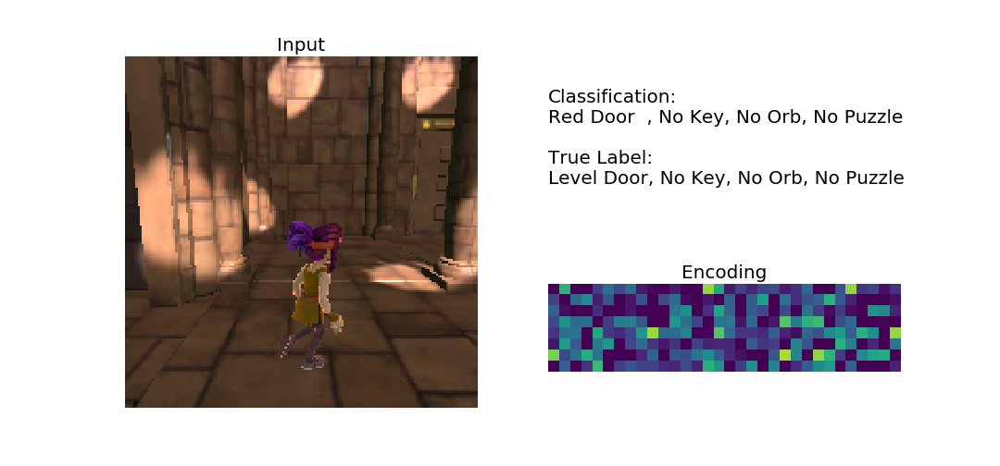
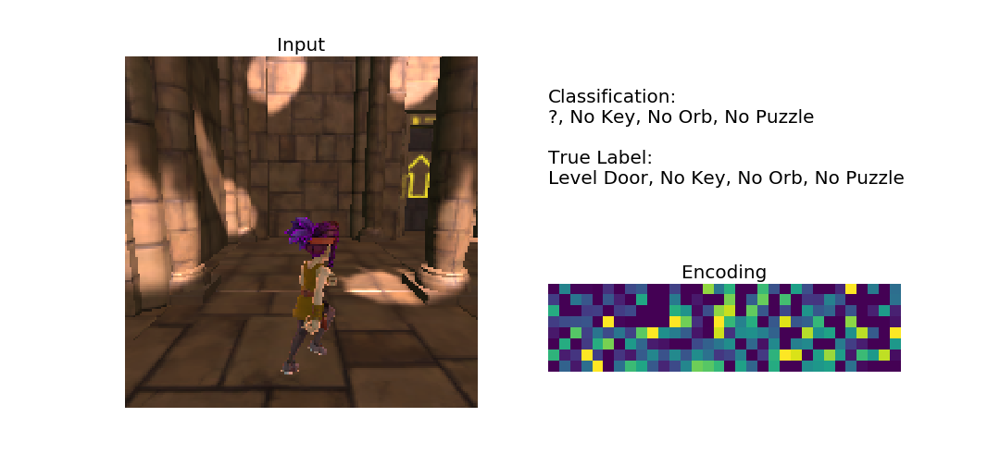
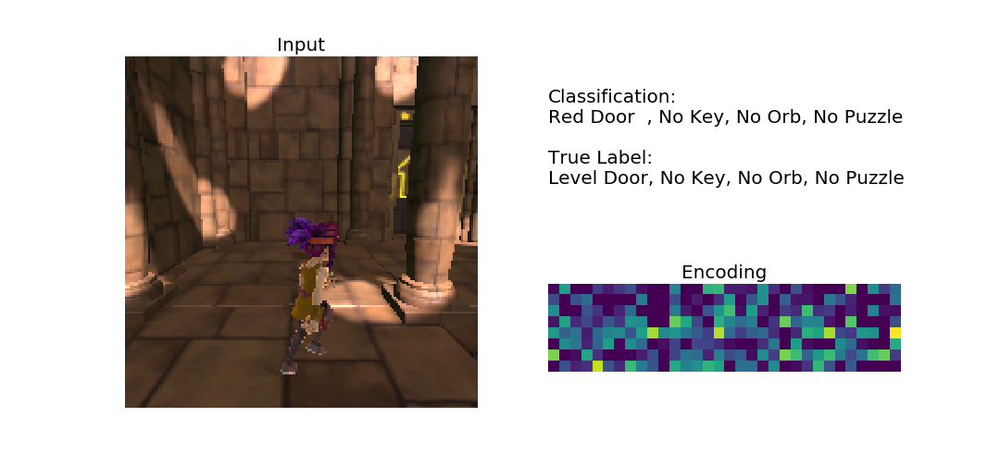
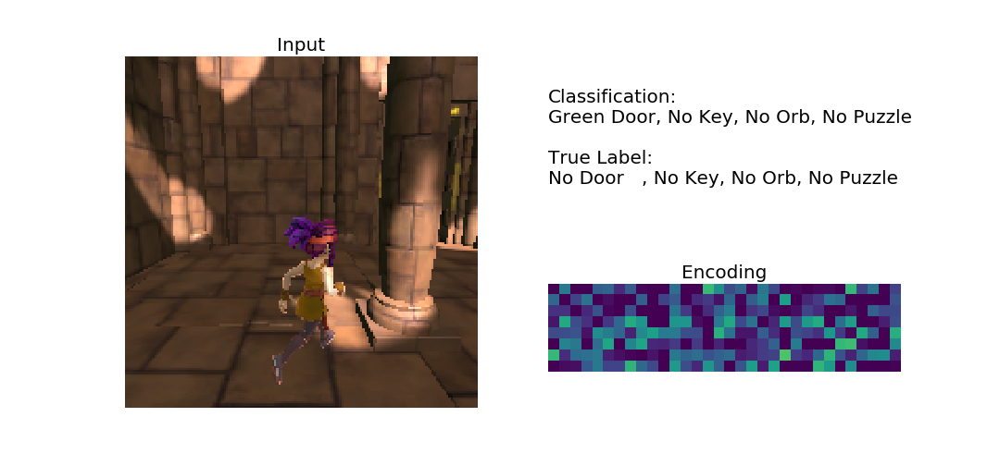
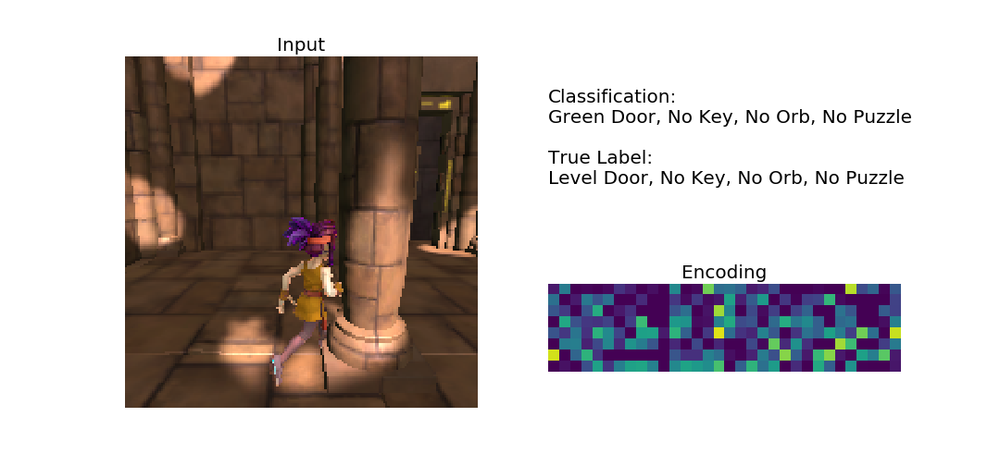

In [69]:
def plot_movie_class(enc_array,image_array,classifications, labels, save=None):
    fig = plt.figure(figsize=(15,7), dpi=72)
    ax1 = plt.subplot(1,2,1)
    im1 = plt.imshow(image_array[0])
    plt.title('Input',fontsize=20)
    plt.axis('off')
    ax2 = plt.subplot(2,2,2)
    title = plt.text(0,0.2,'Classification:\n'+ClassToWords(classifications[0])+'\n\nTrue Label:\n'+
              ClassToWords(labels[0]),fontsize=20)
    plt.axis('off')
    ax3 = plt.subplot(2,2,4)
    im2 = plt.imshow(enc_array[0].reshape((8,32)))
    plt.title('Encoding',fontsize=20)
    plt.axis('off')
    
    
    Writer = animation.writers['ffmpeg']
    writer = Writer(fps=10, metadata=dict(artist='Me'), bitrate=1800)

    def animate(i):
        im1.set_array(image_array[i])
        im2.set_array(enc_array[i].reshape((8,32)))
        title.set_text('Classification:\n'+ClassToWords(classifications[i])+'\n\nTrue Label:\n'+ClassToWords(labels[i]))
        return (im1,)

    anim = animation.FuncAnimation(fig, animate, frames=len(image_array))
    display(IPython_display.display_animation(anim))
    if save!=None:
        anim.save(save, writer=writer)

n = 10
plot_movie_class(act[:n],obs[:n],out[:n], fLabels[:n], save=None)

### No Errors


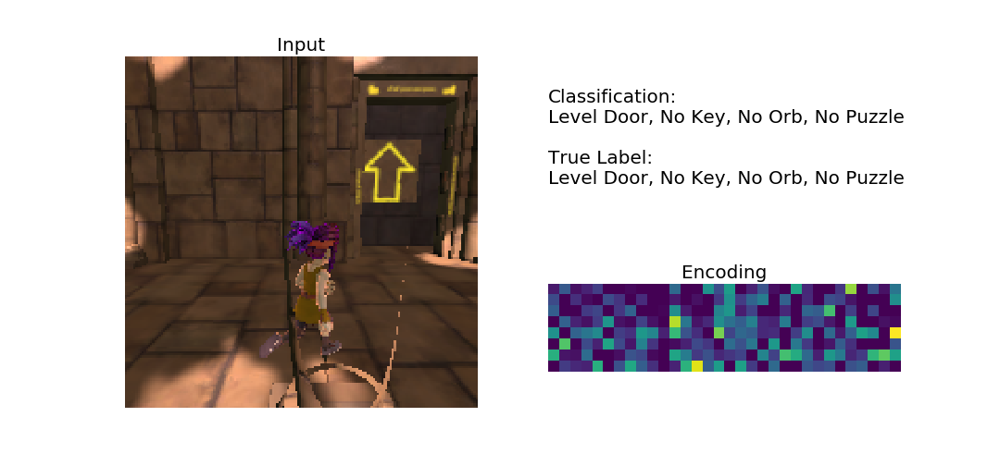
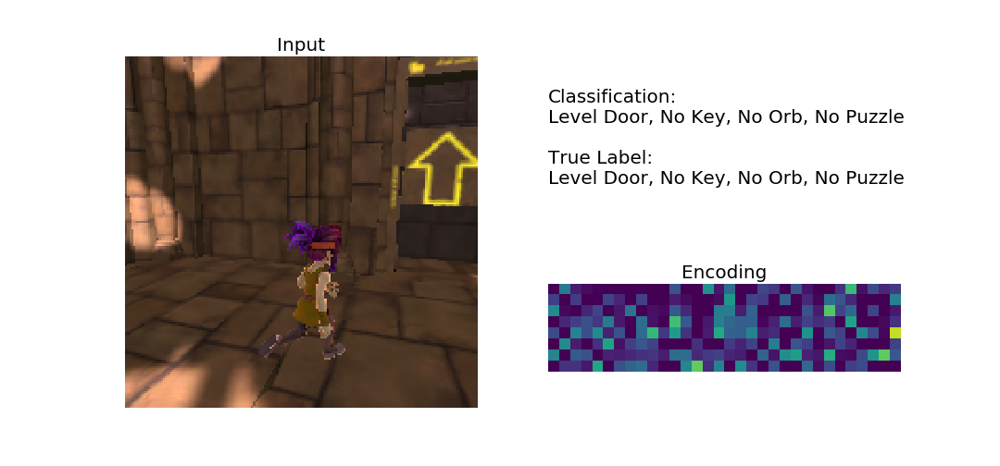
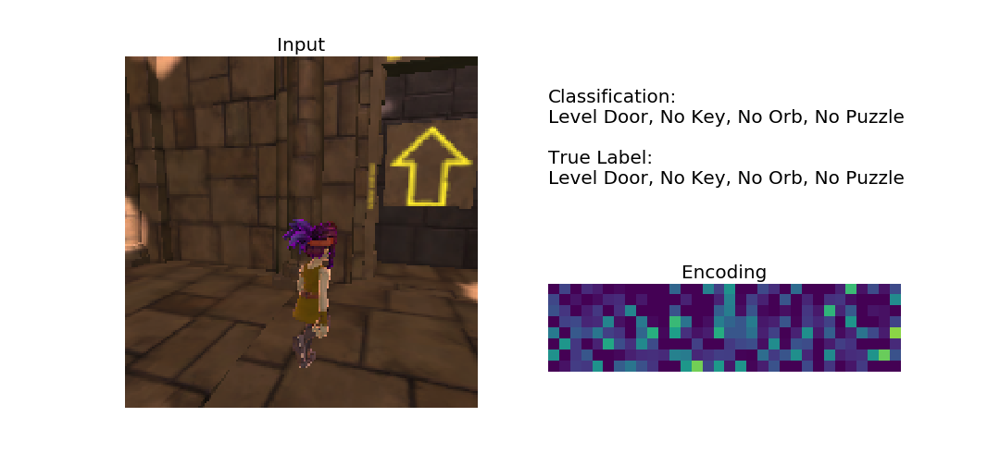
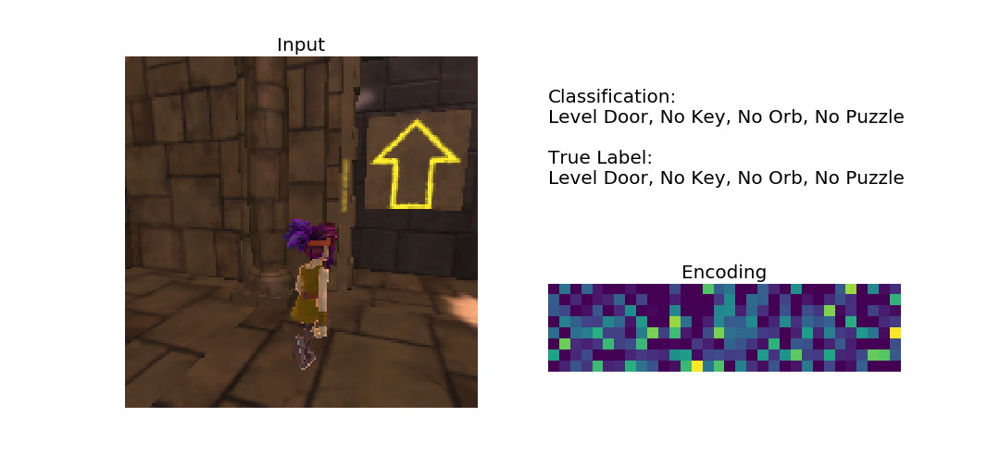
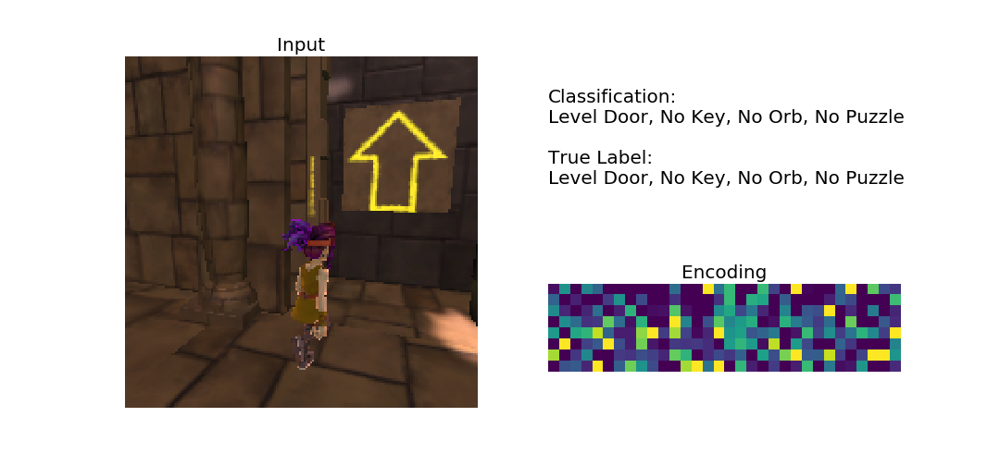
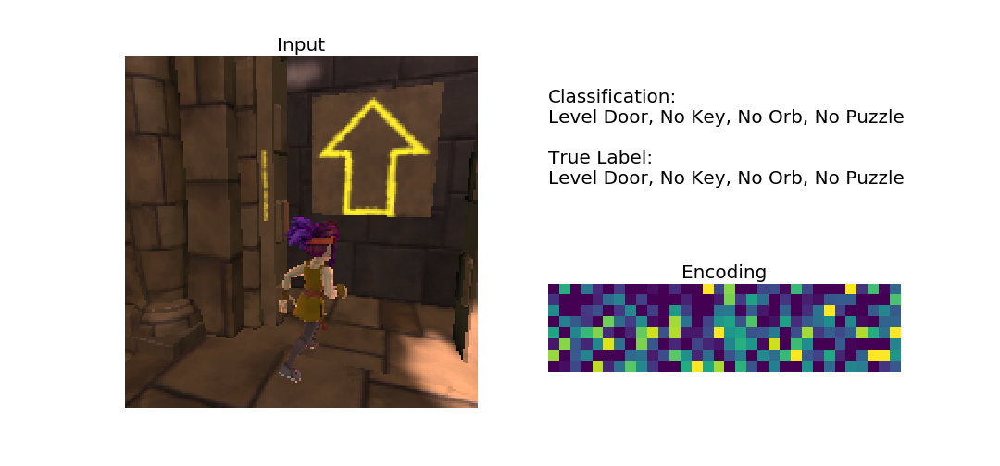
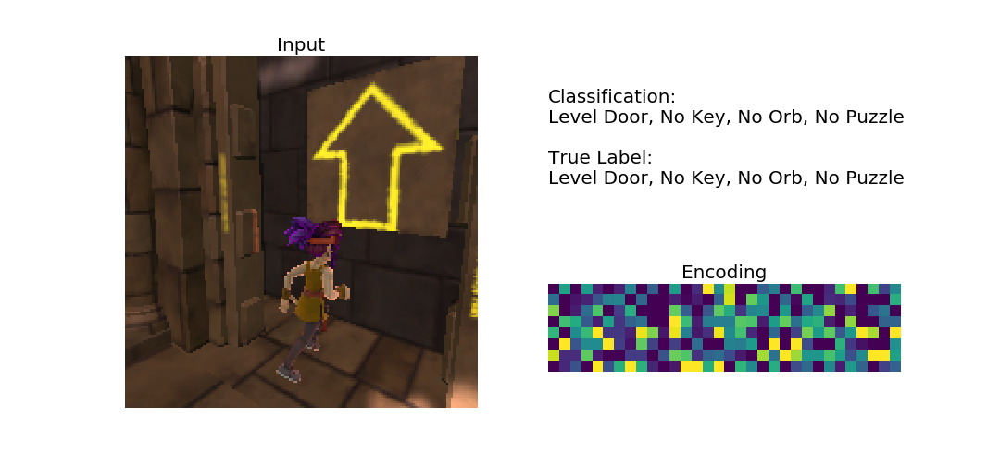
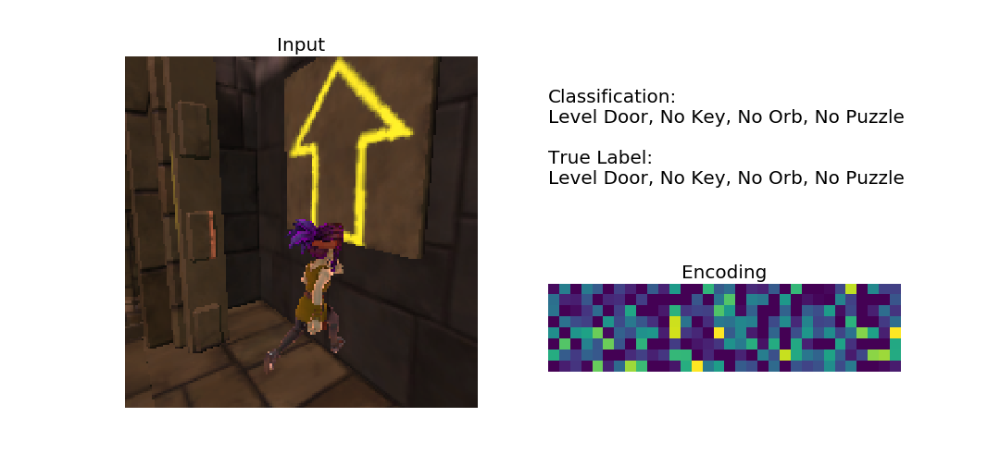
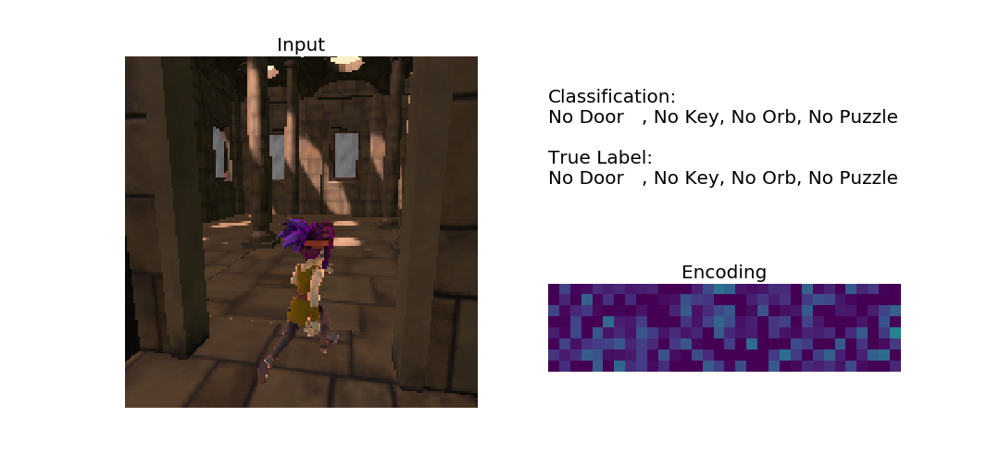
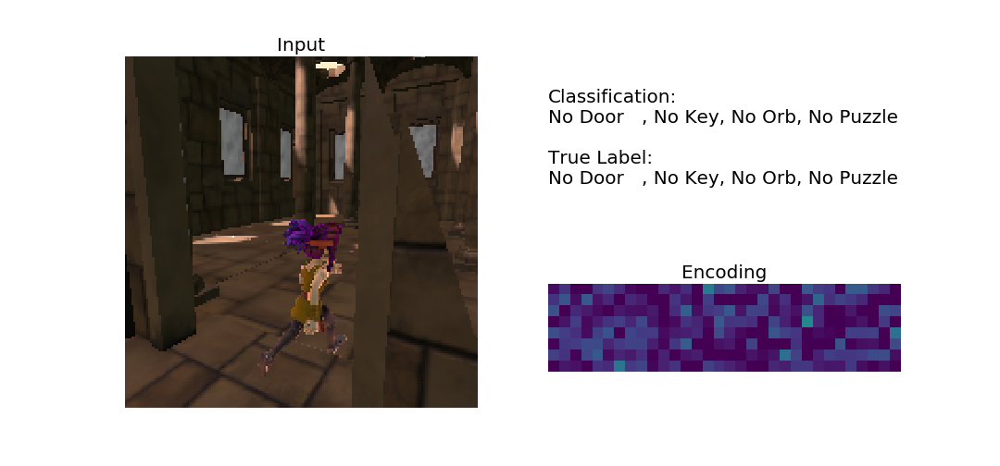

In [70]:
where = np.where(np.sum(out==fLabels,axis=1)==4)
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### 1 Error


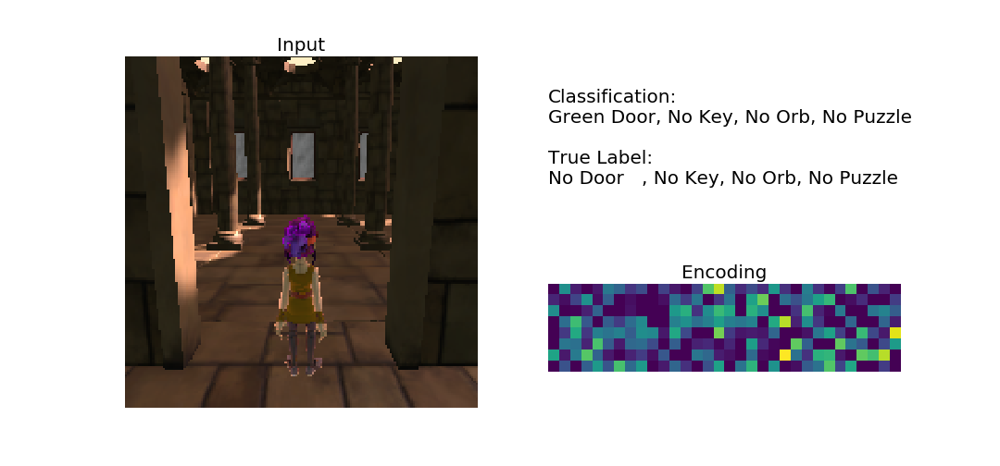
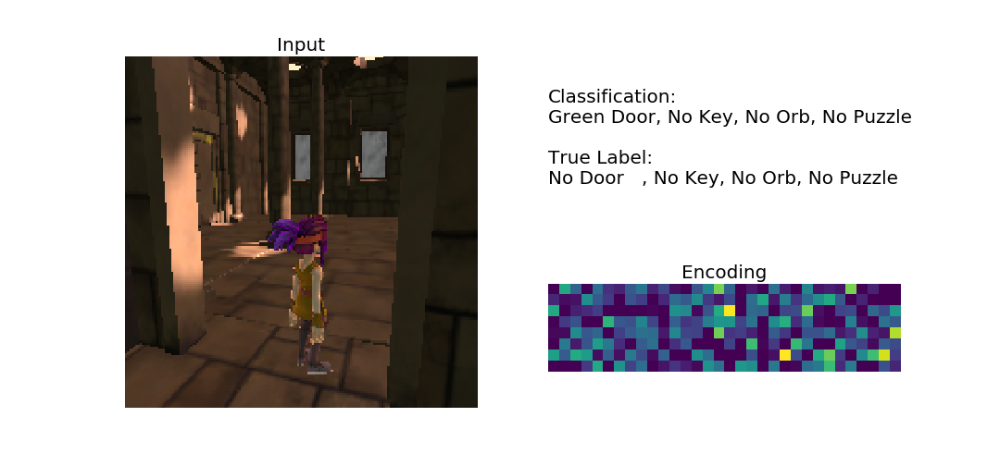
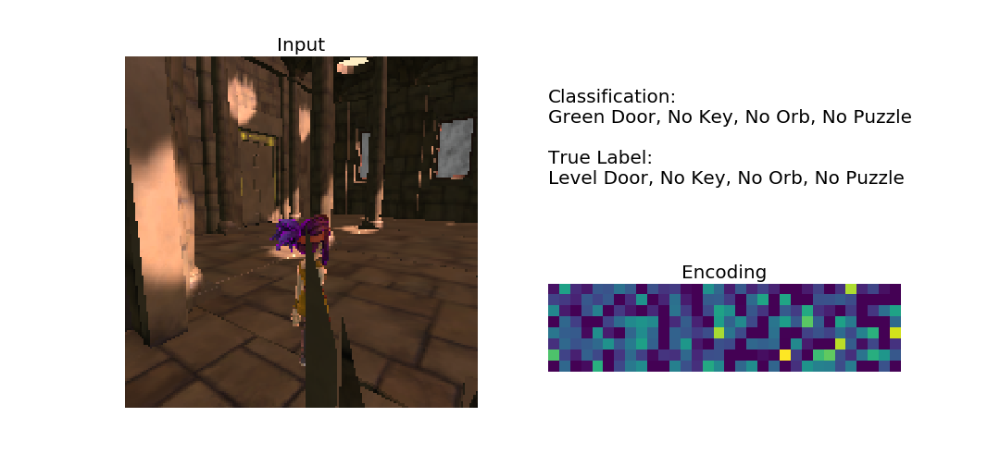
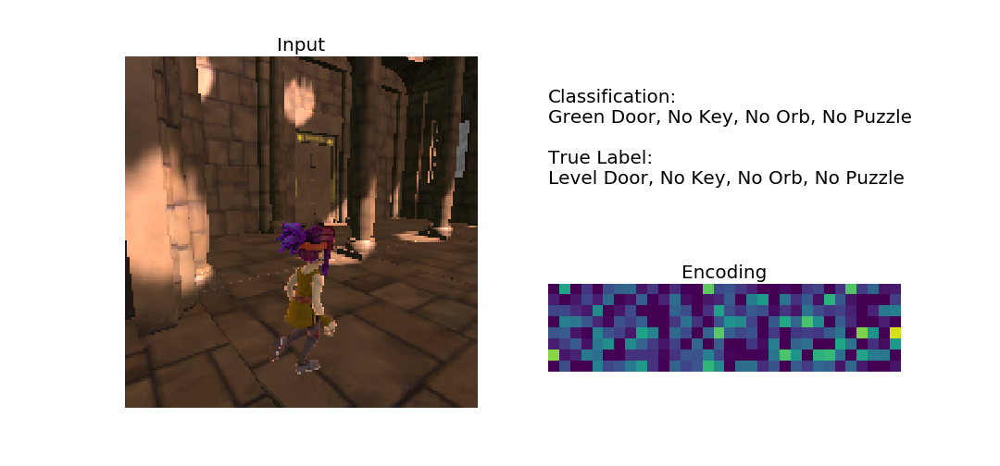
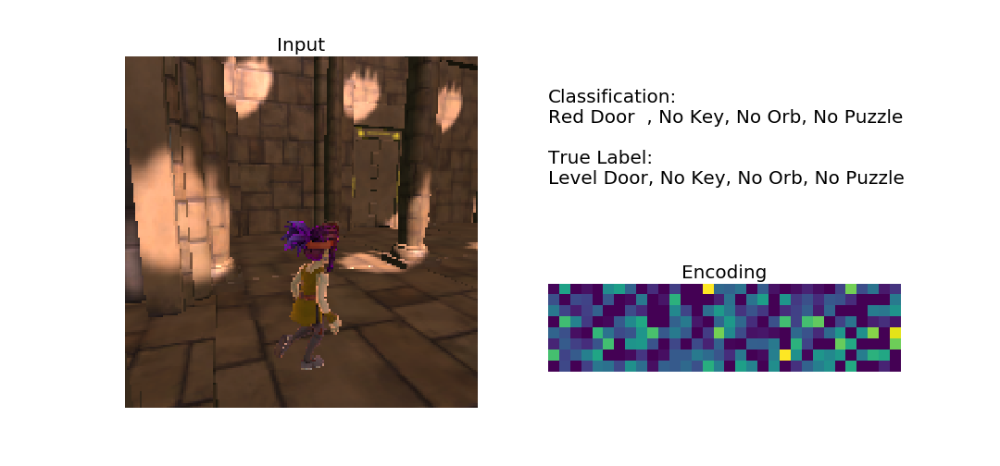
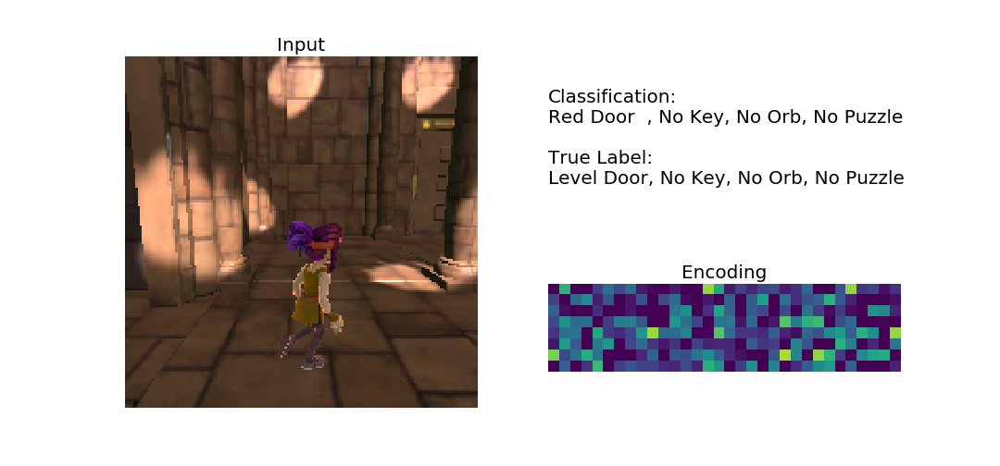
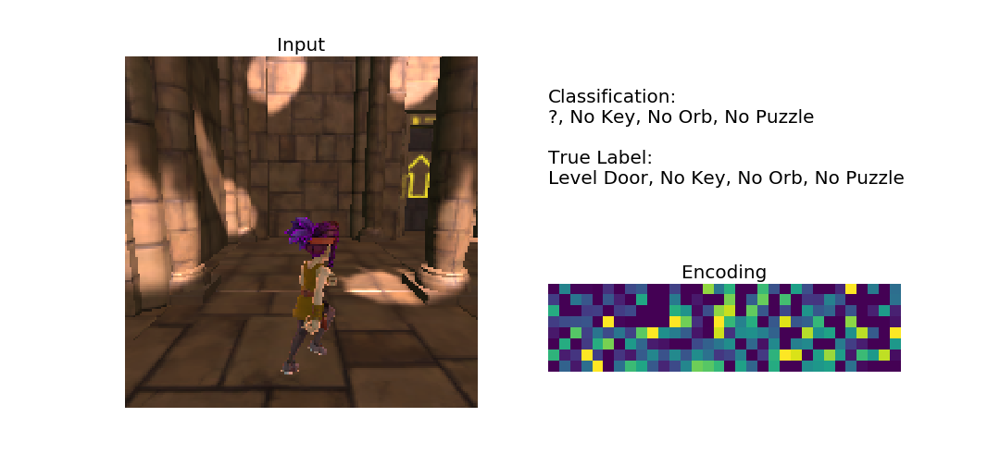
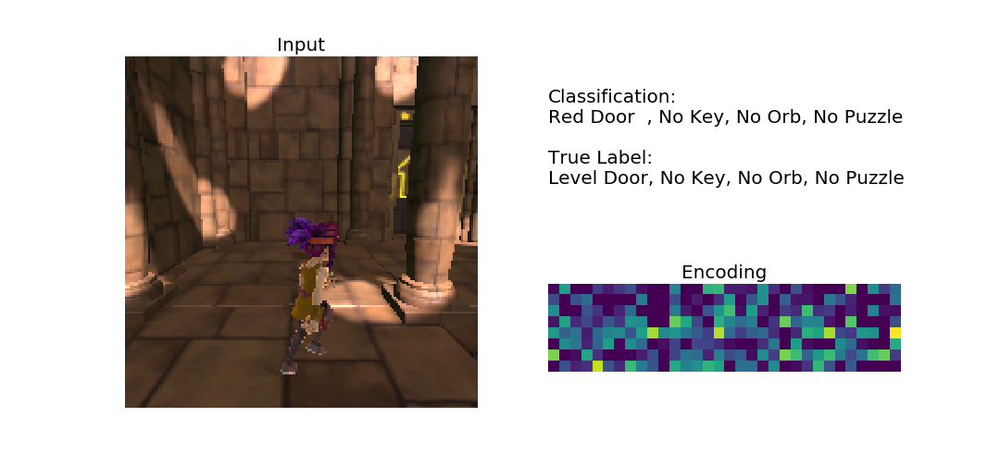
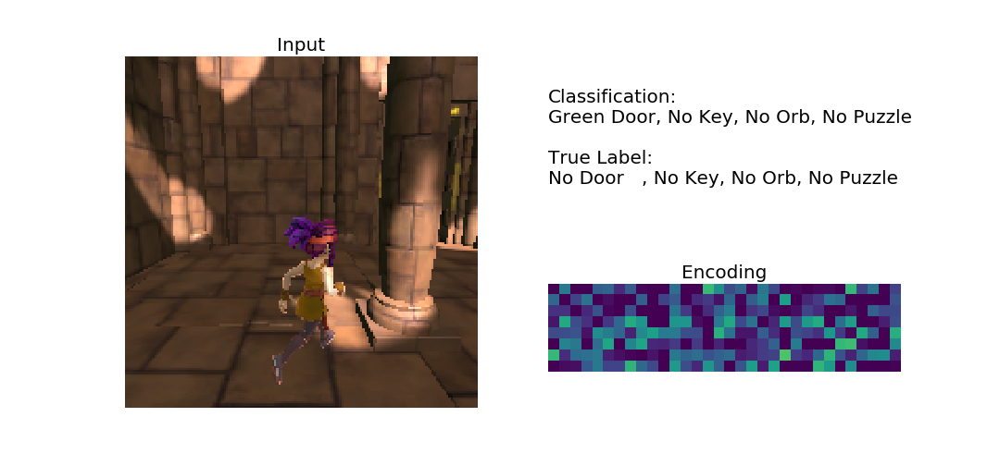
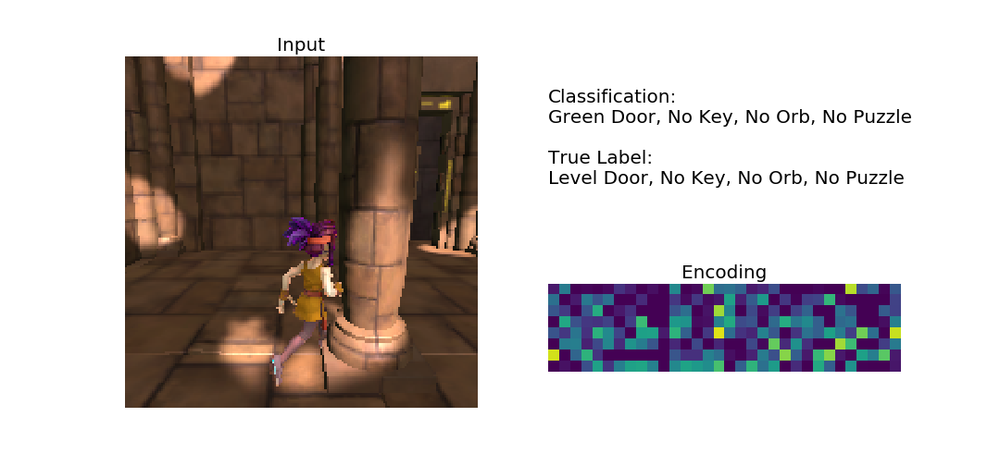

In [77]:
where = np.where(np.sum(out==fLabels,axis=1)==3)
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### 2 Errors


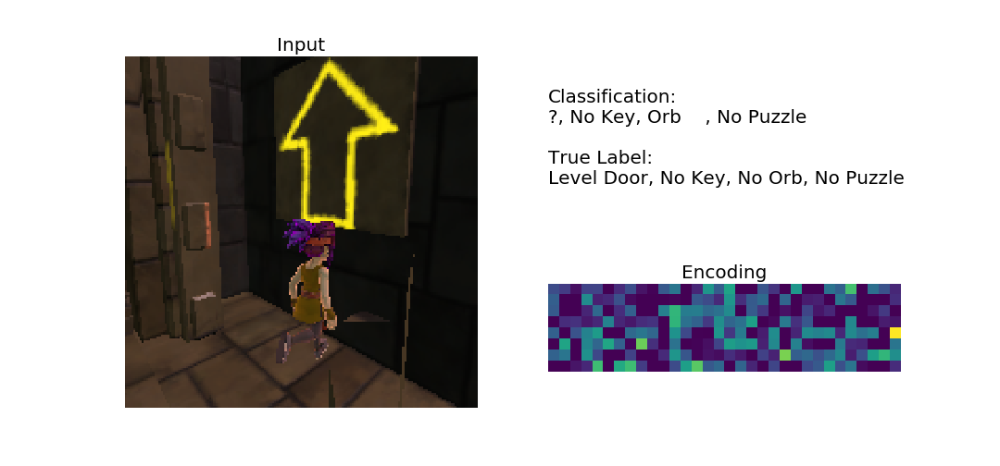
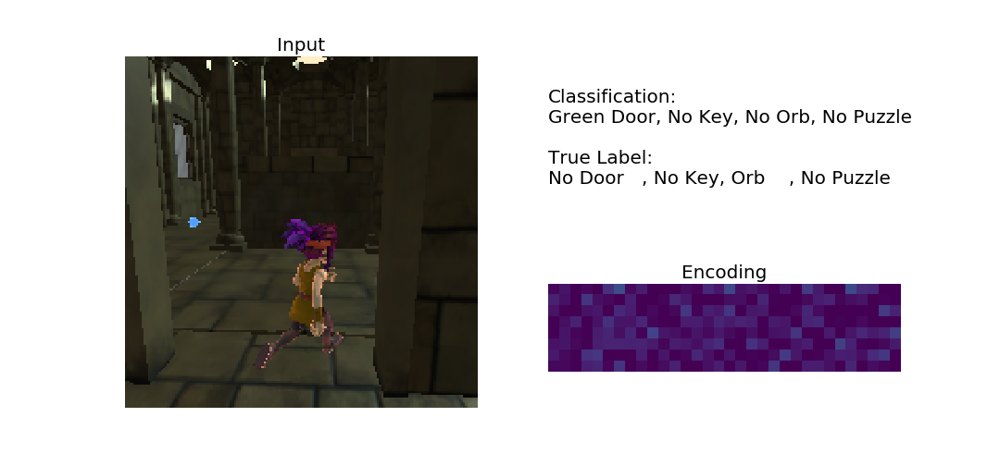
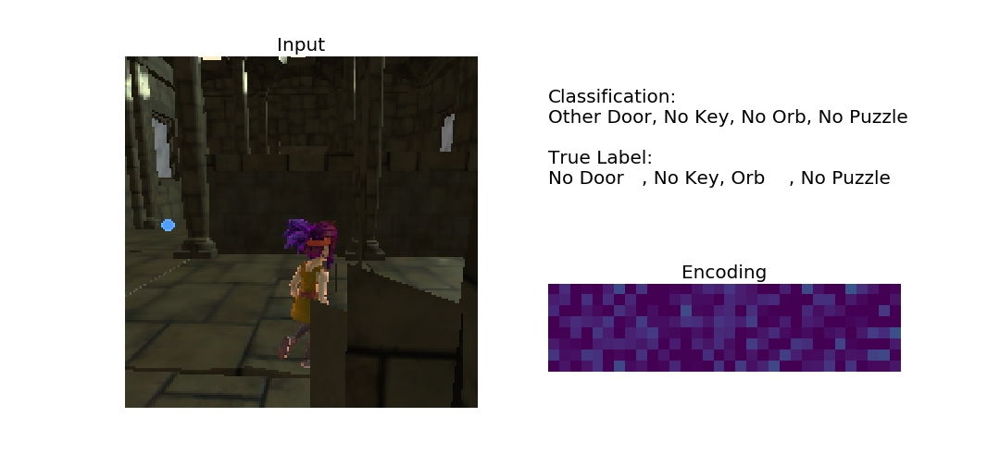
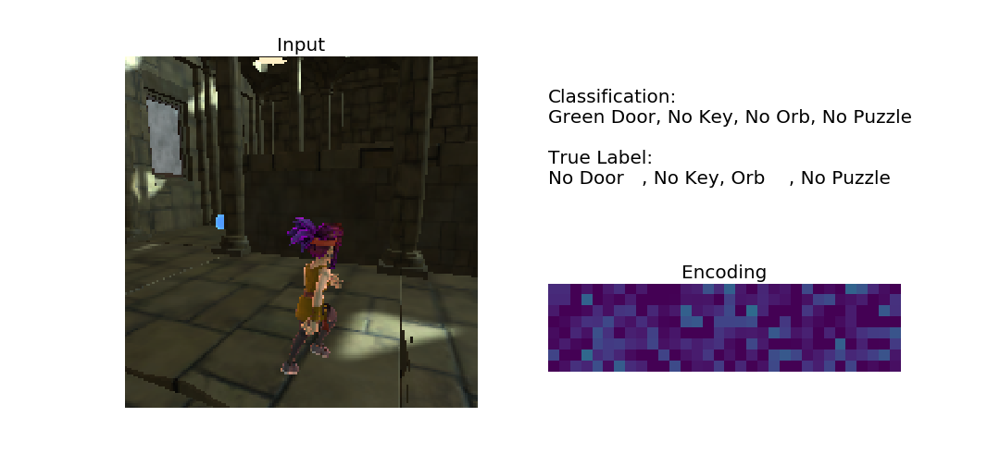
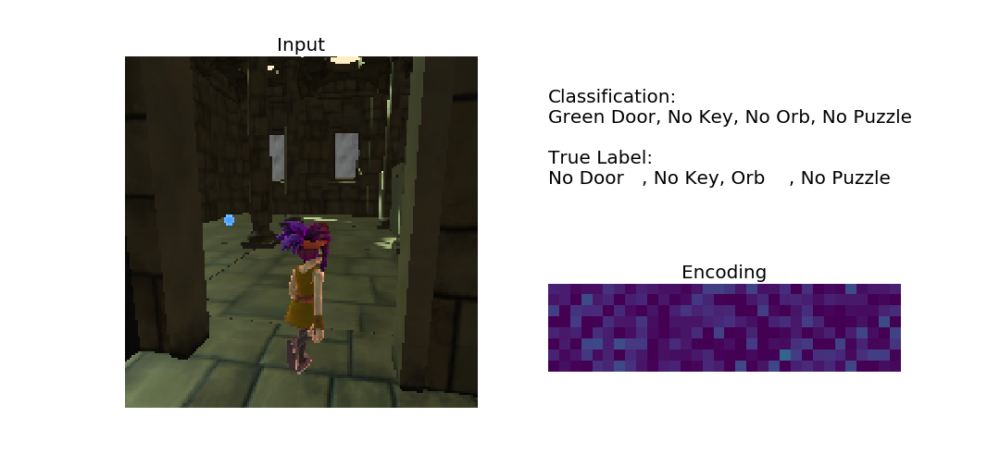
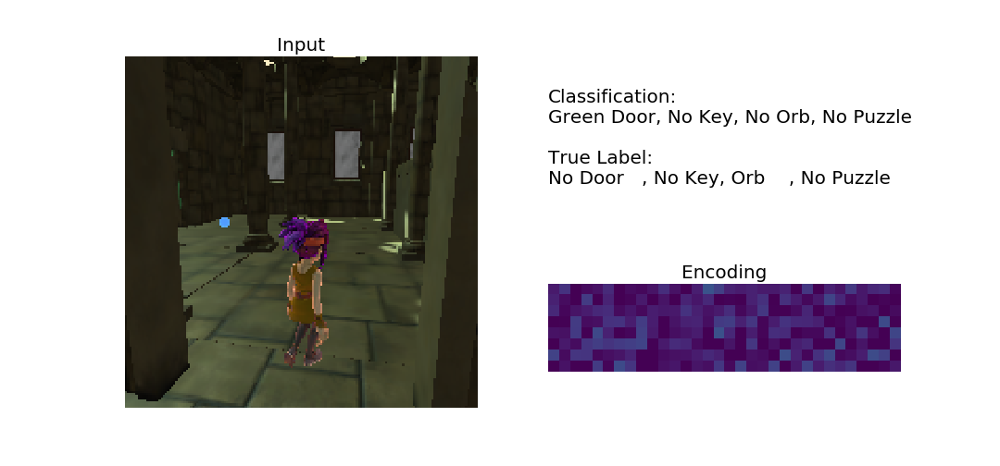
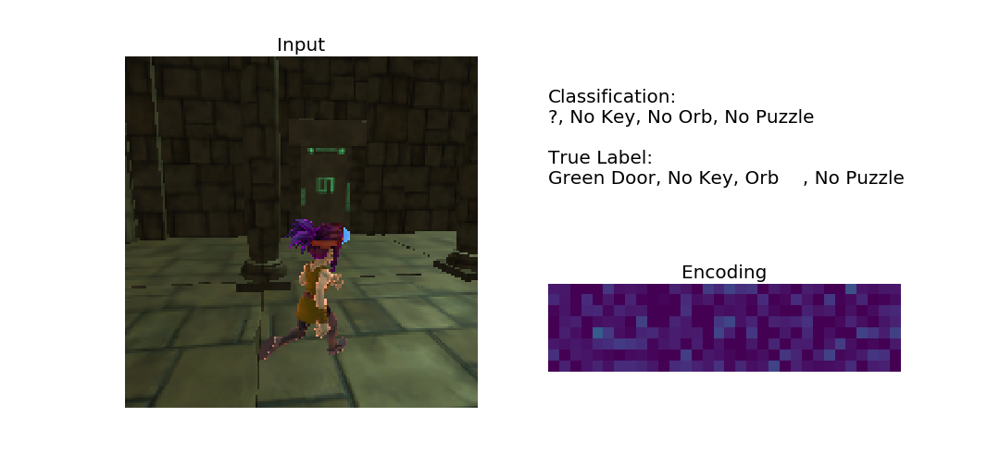
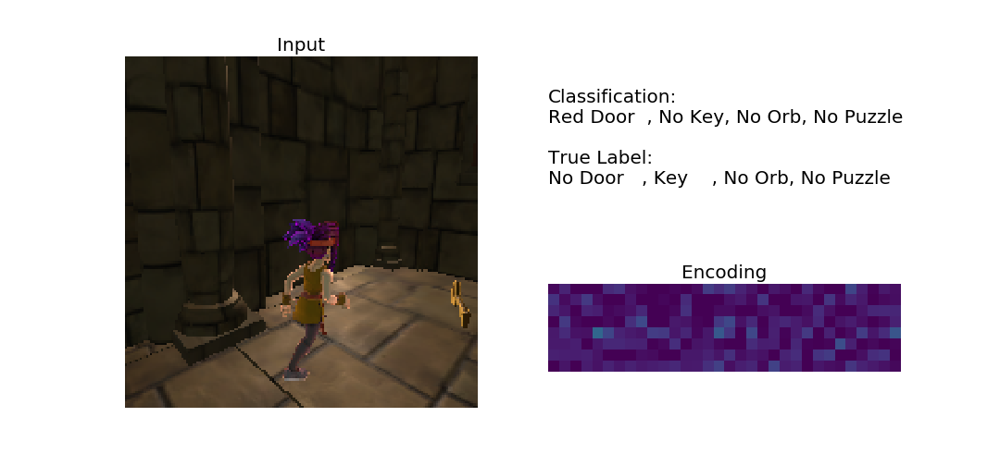
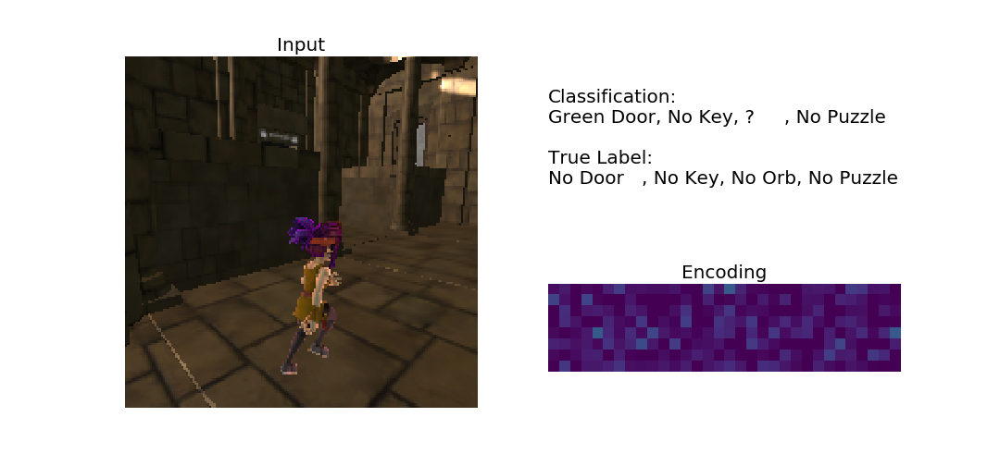
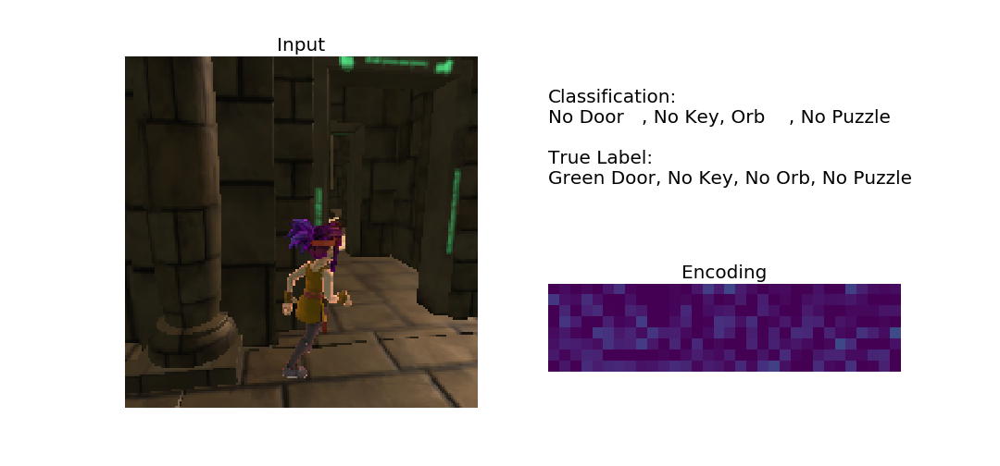

In [78]:
where = np.where(np.sum(out==fLabels,axis=1)==2)
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### 3 Errors


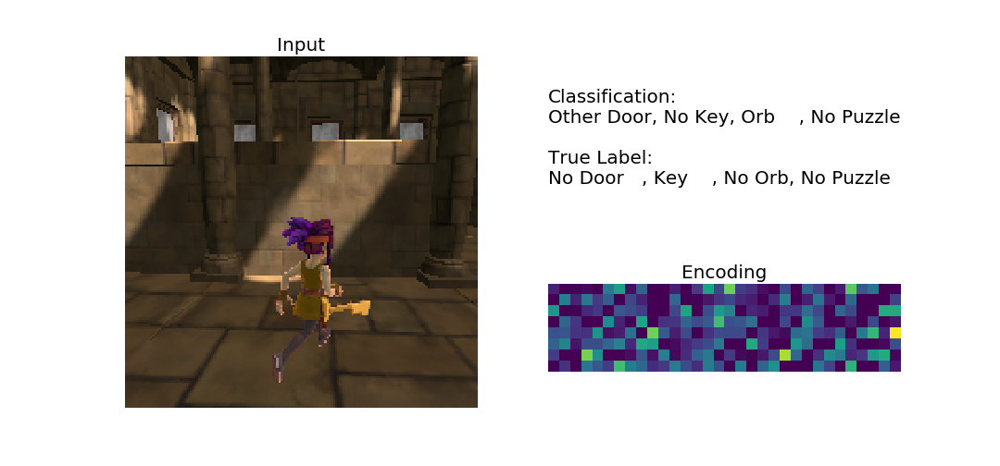
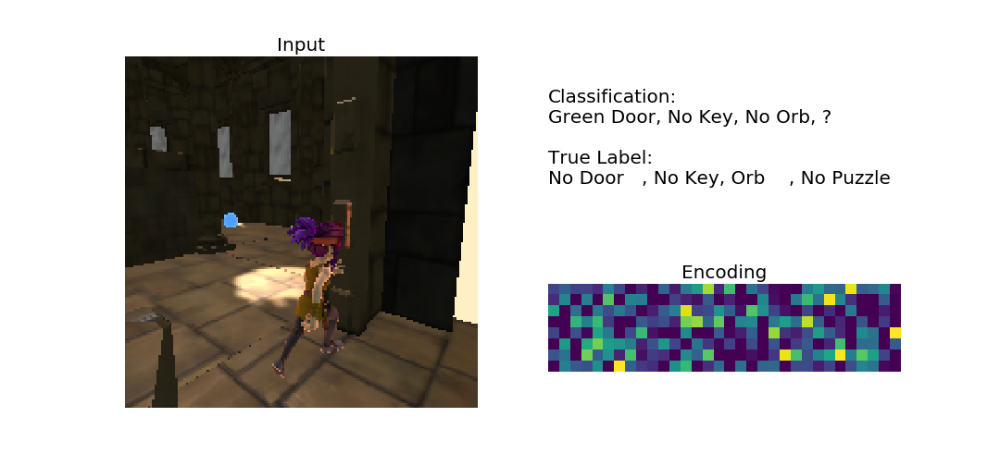
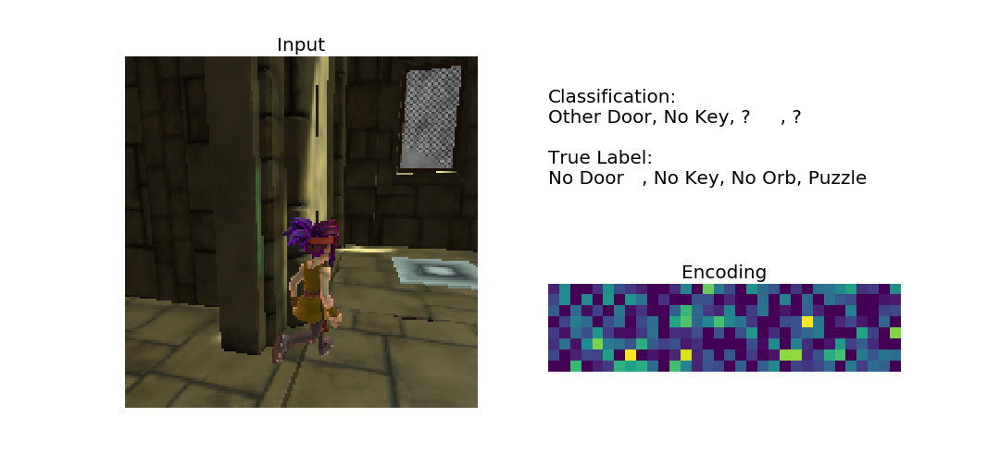
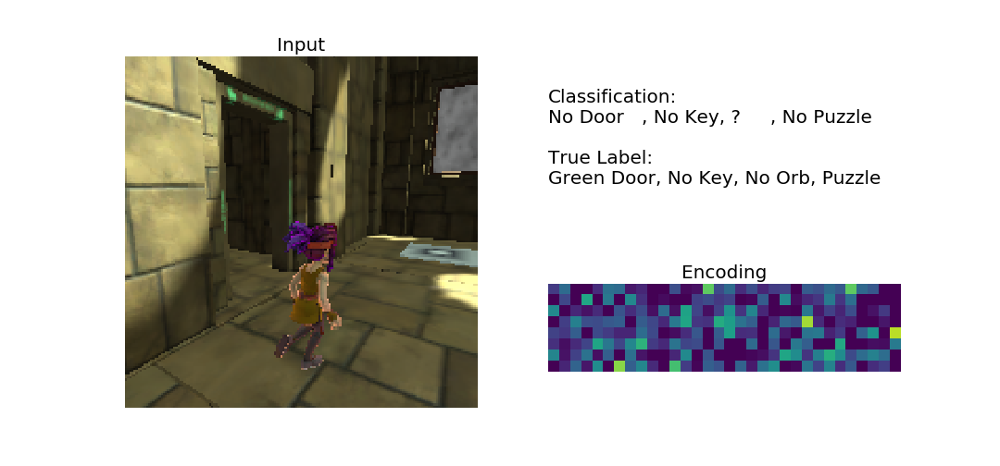
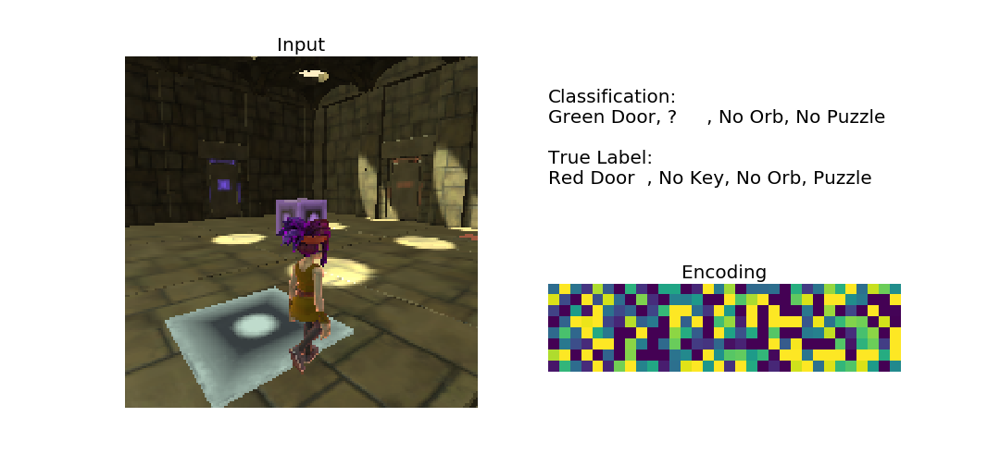
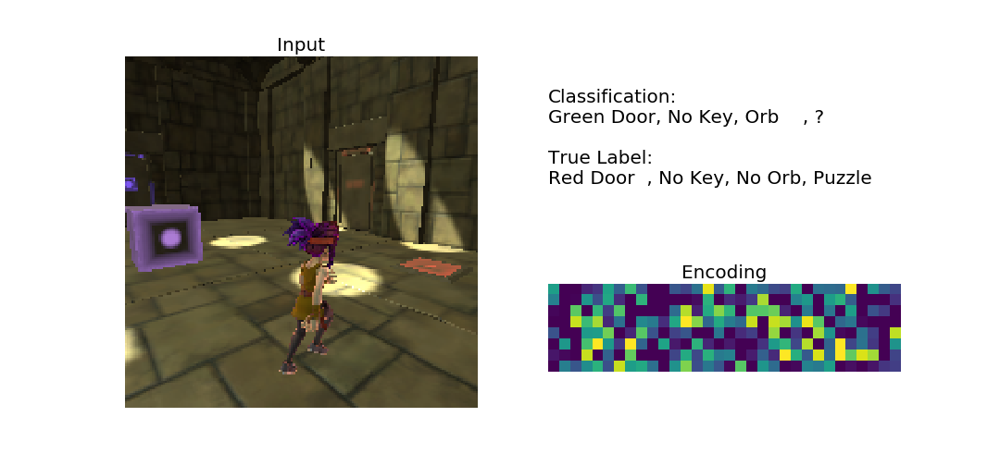
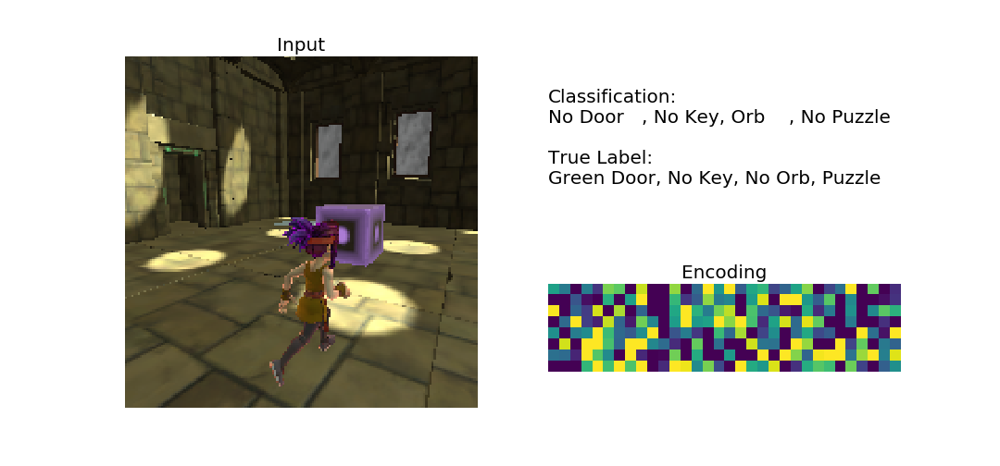
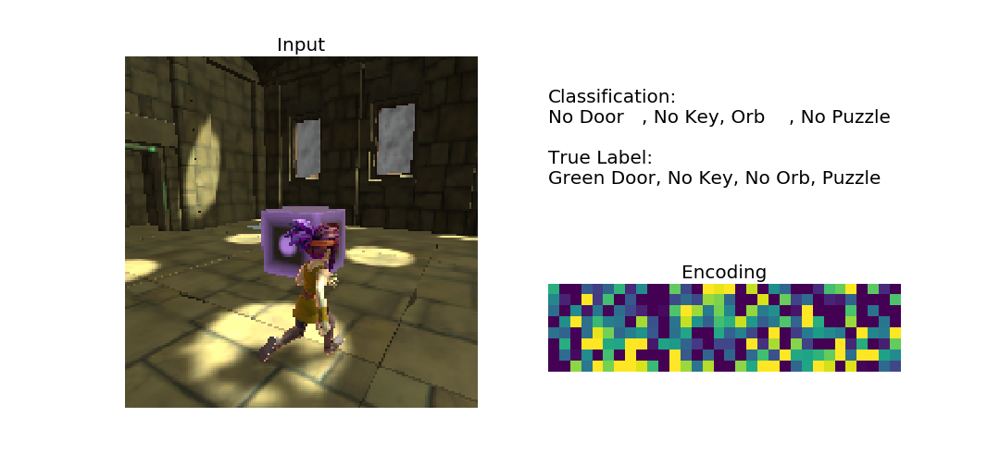
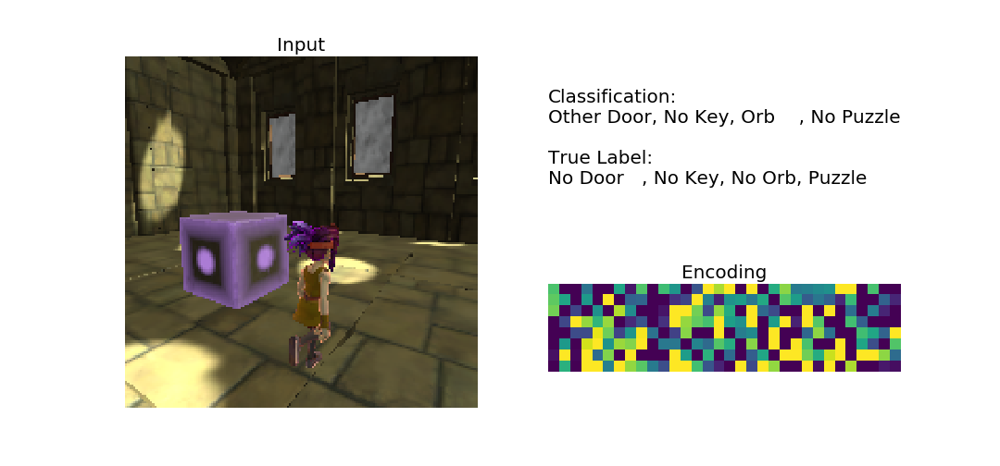
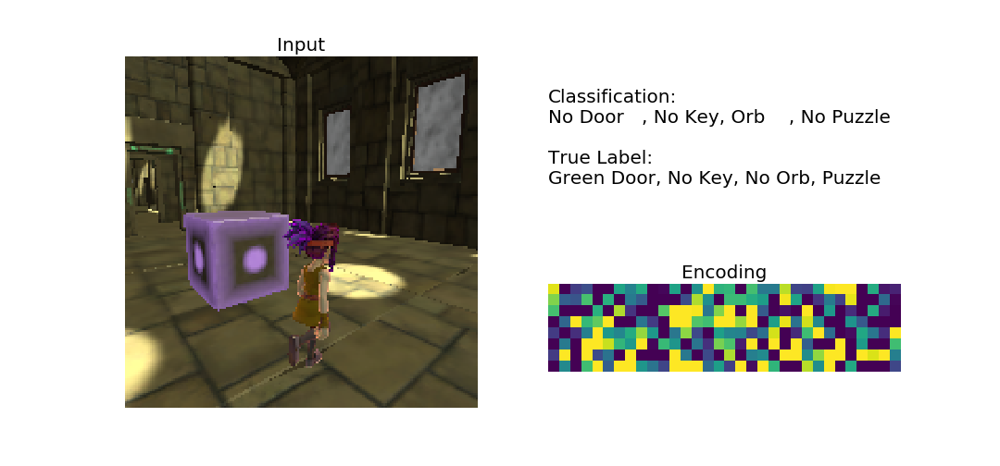

In [79]:
where = np.where(np.sum(out==fLabels,axis=1)==1)
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### False Positive - Key


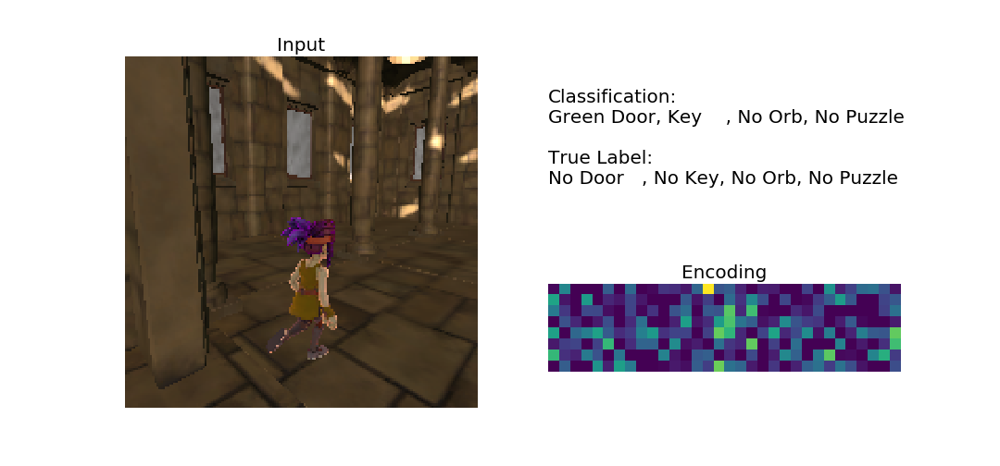
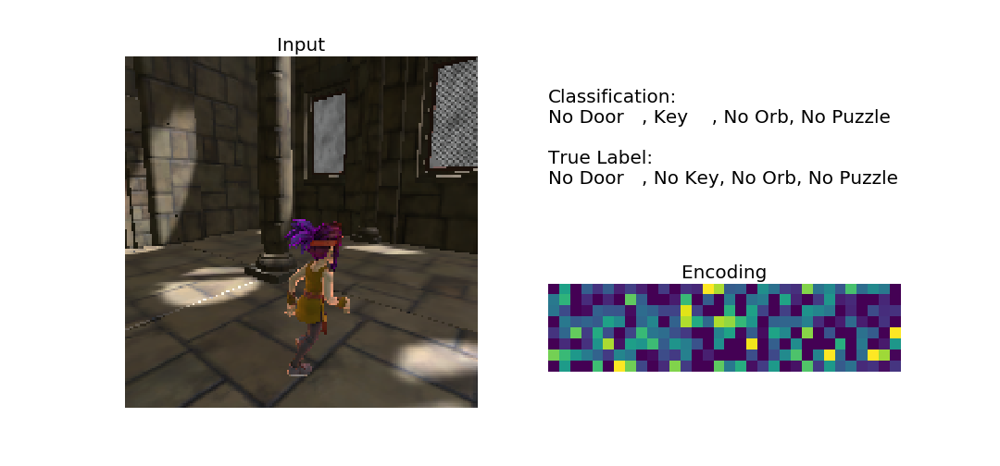
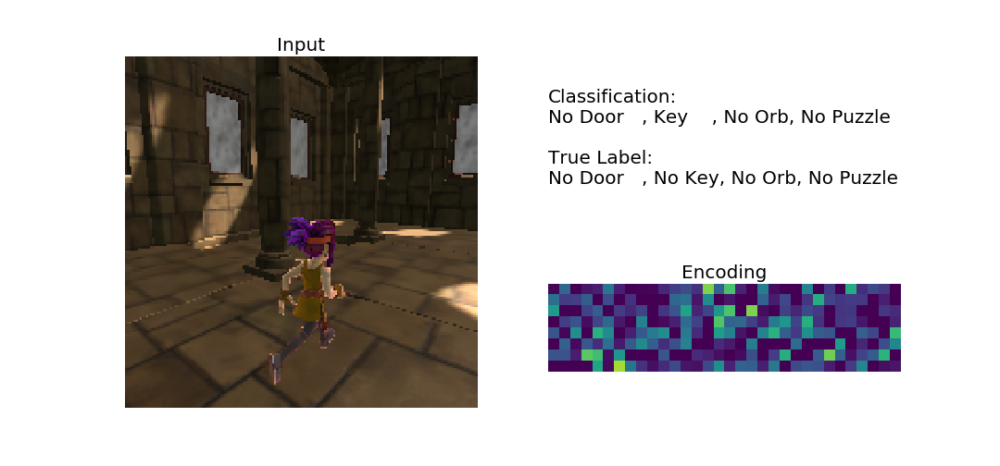
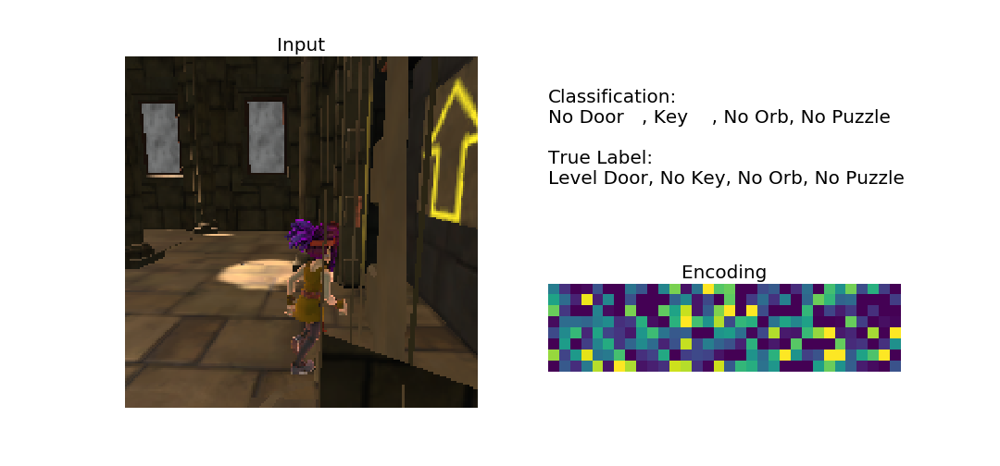
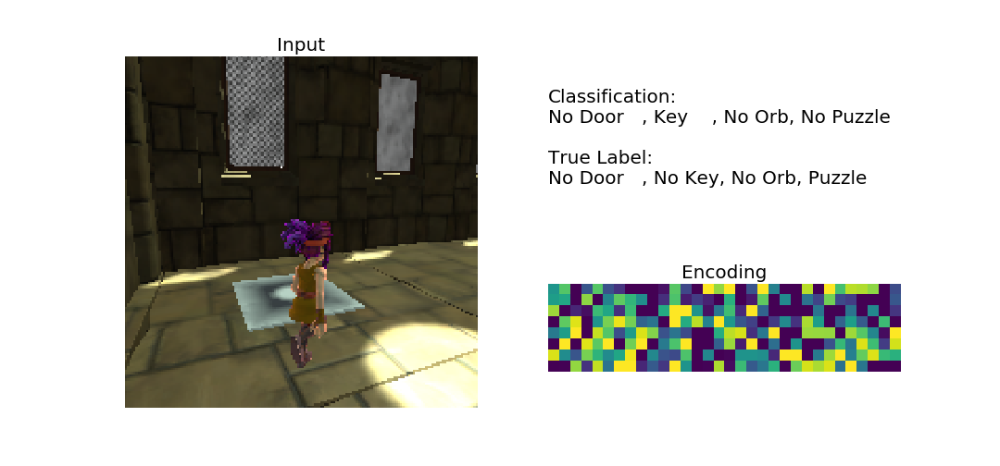
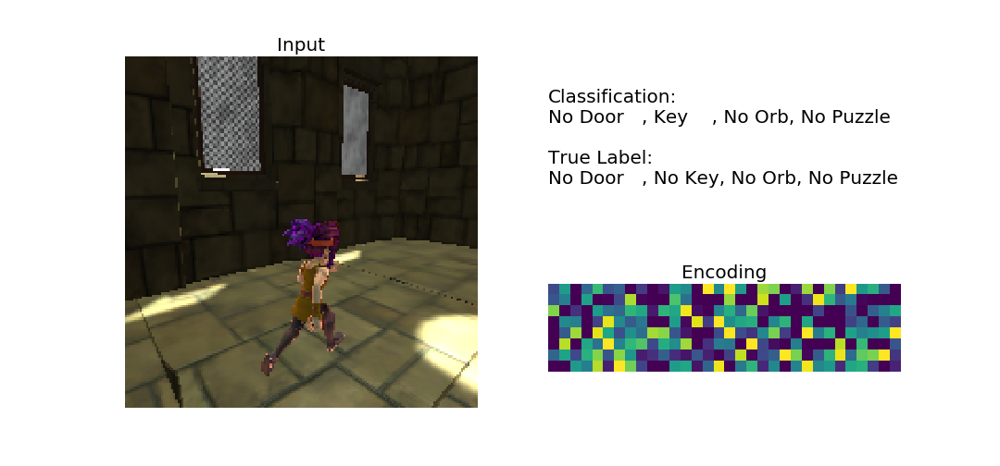
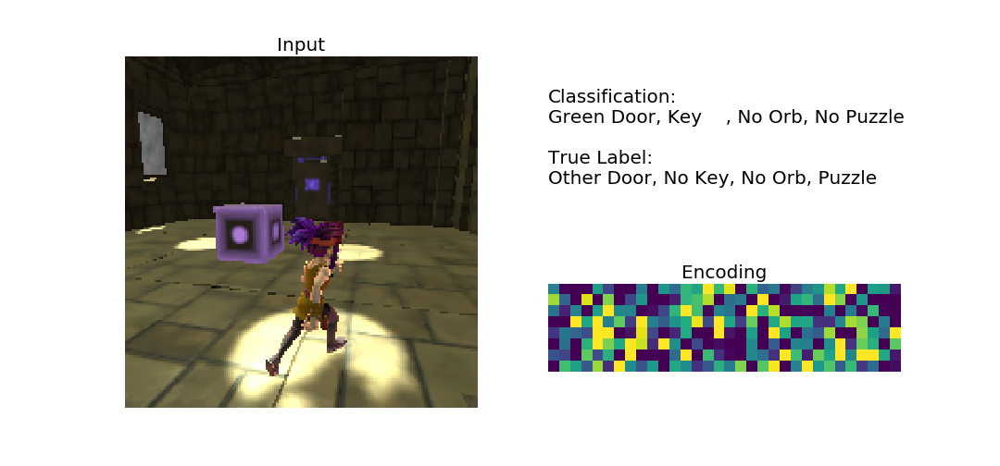
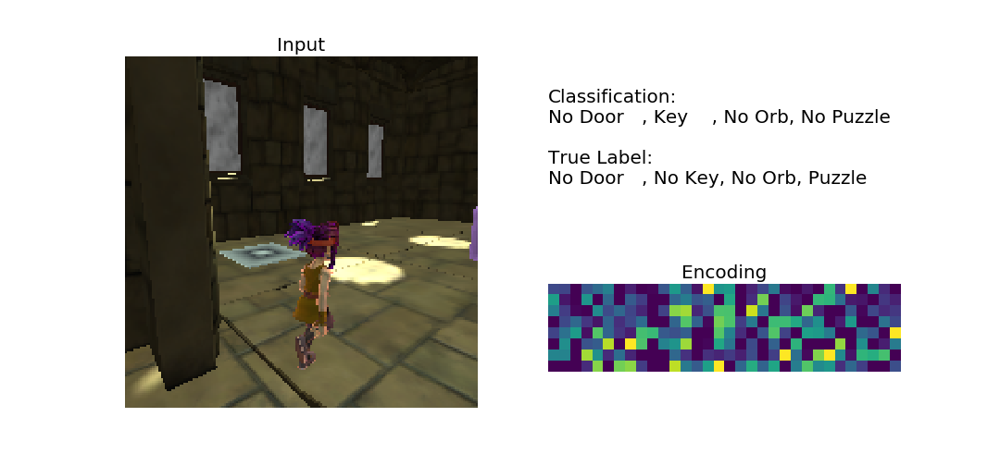
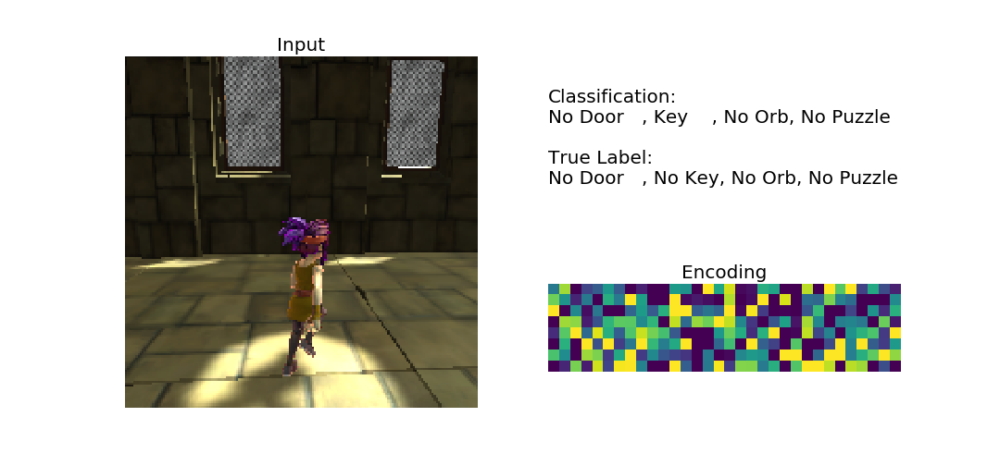
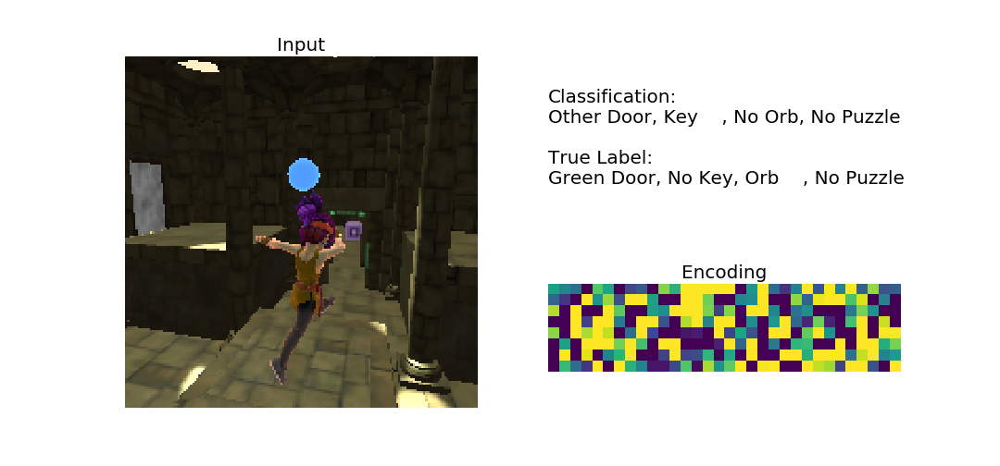

In [86]:
where = np.where((out[:,1]==1)&(fLabels[:,1]==0))
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### False Negative - Key


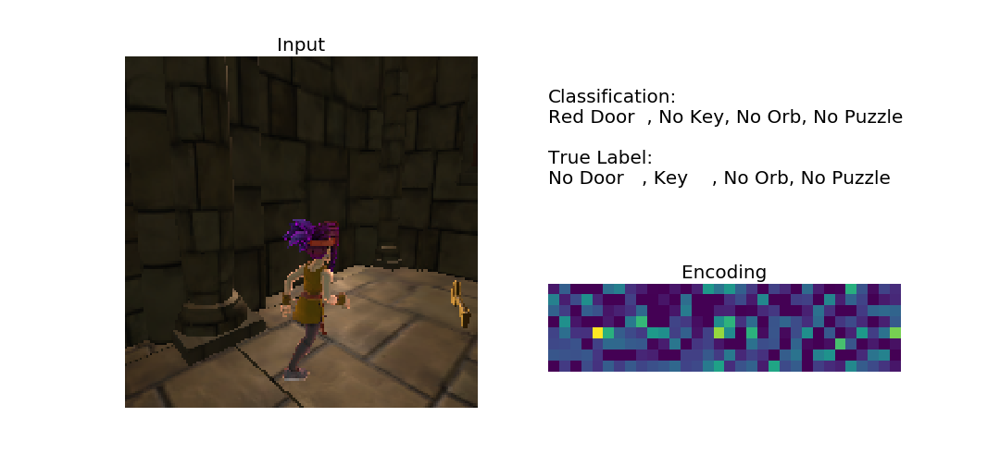
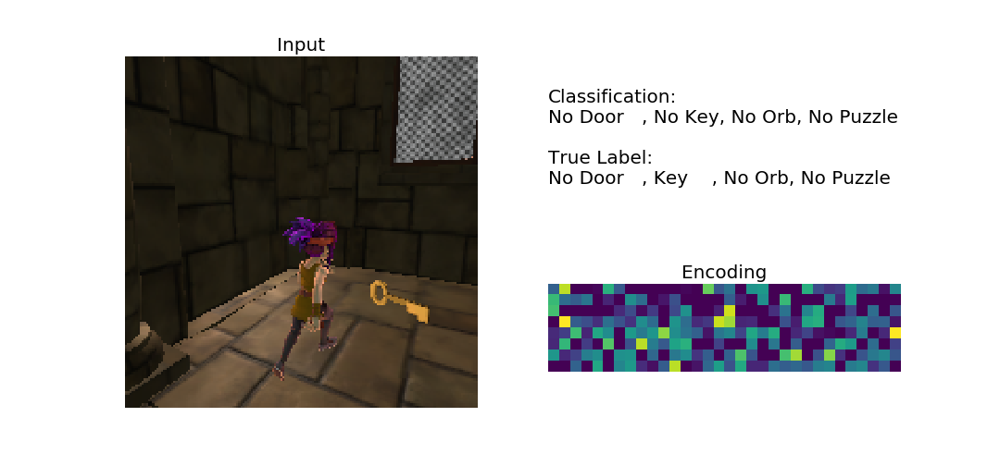
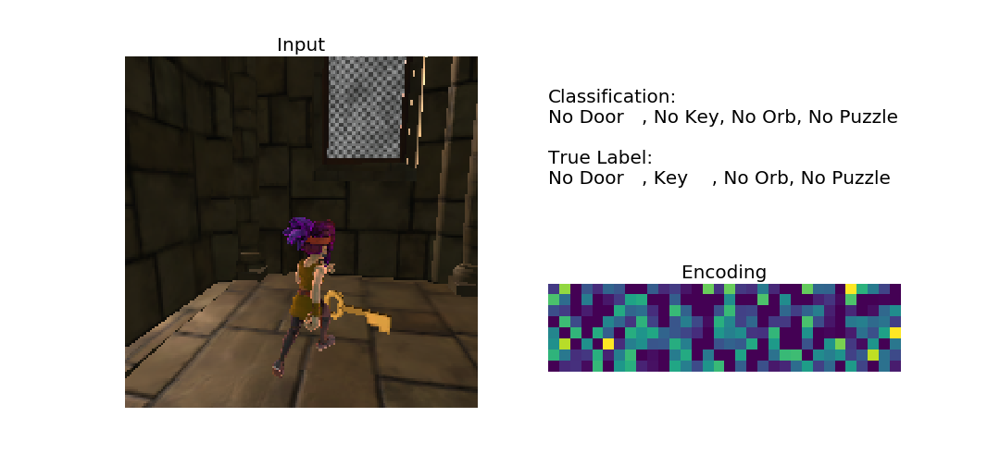
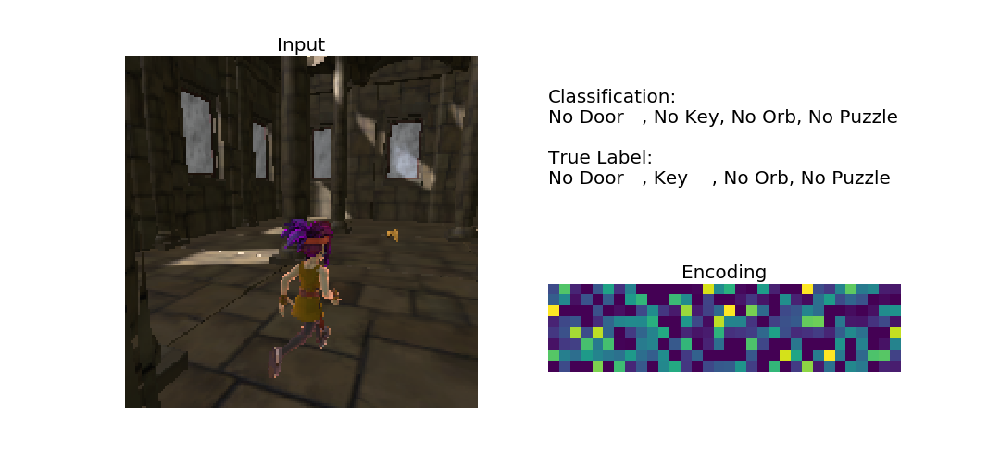
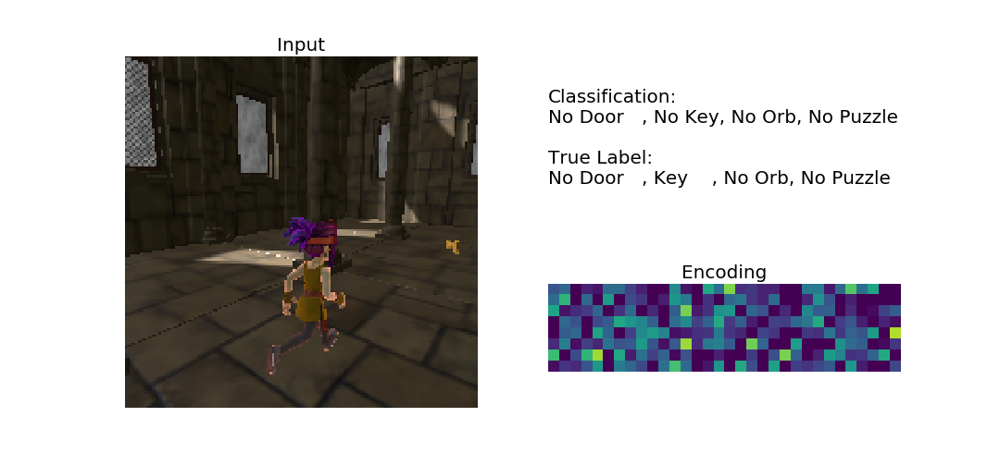
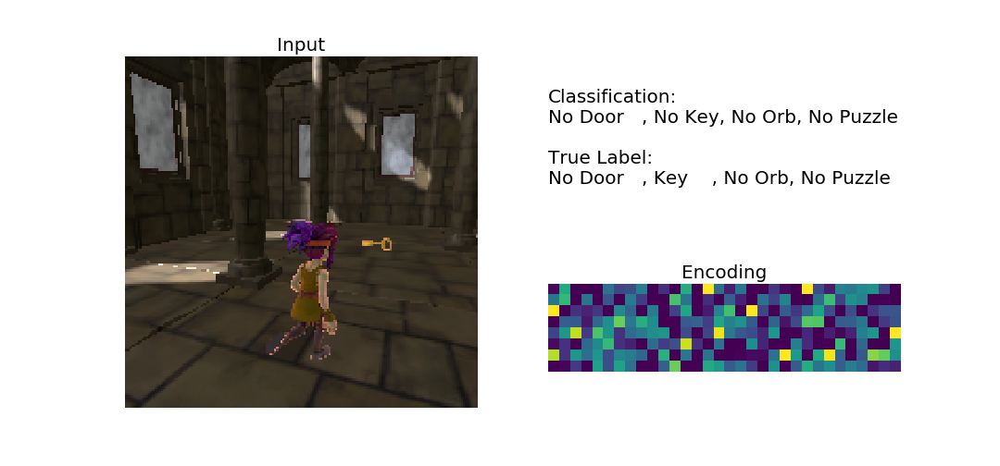
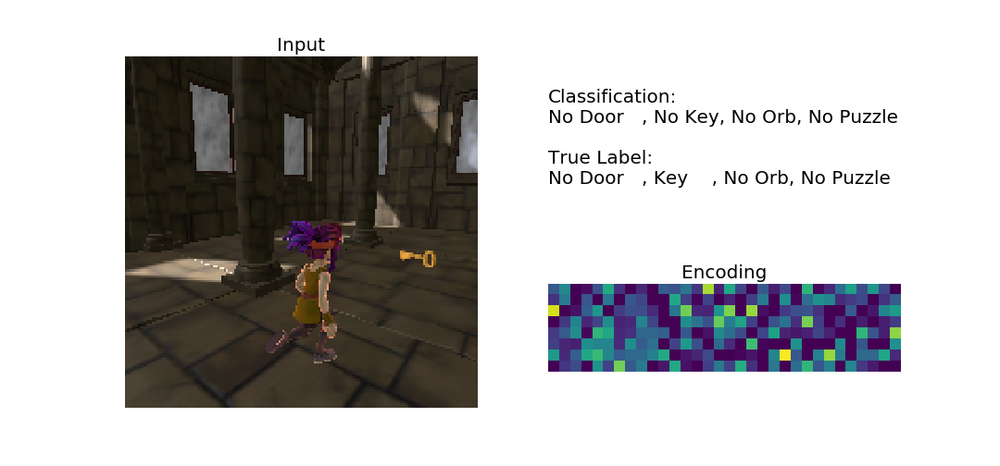
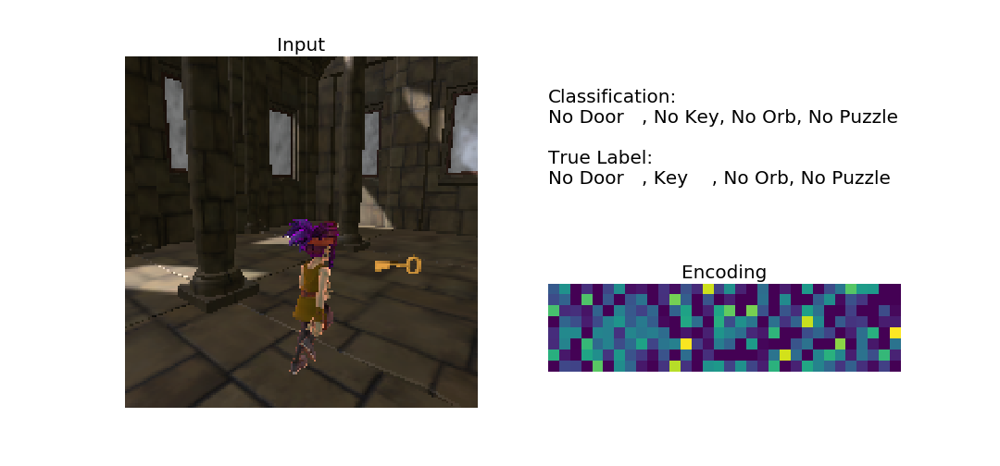
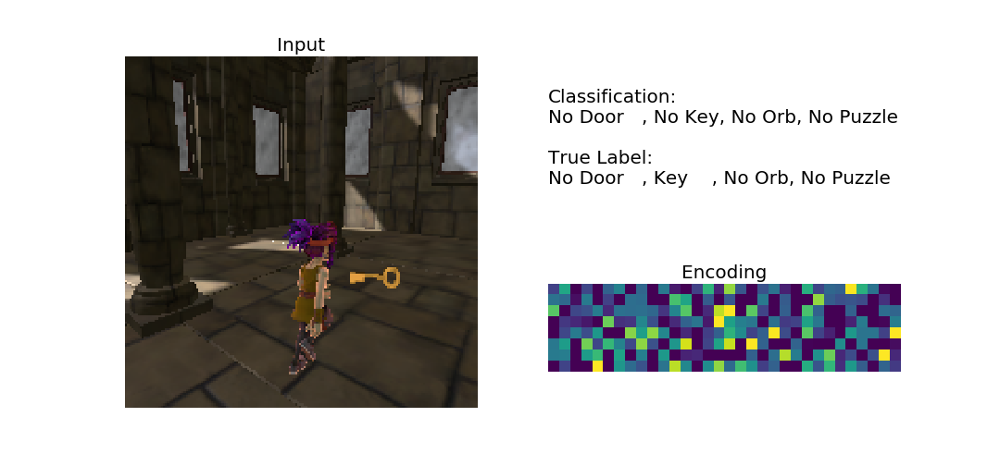
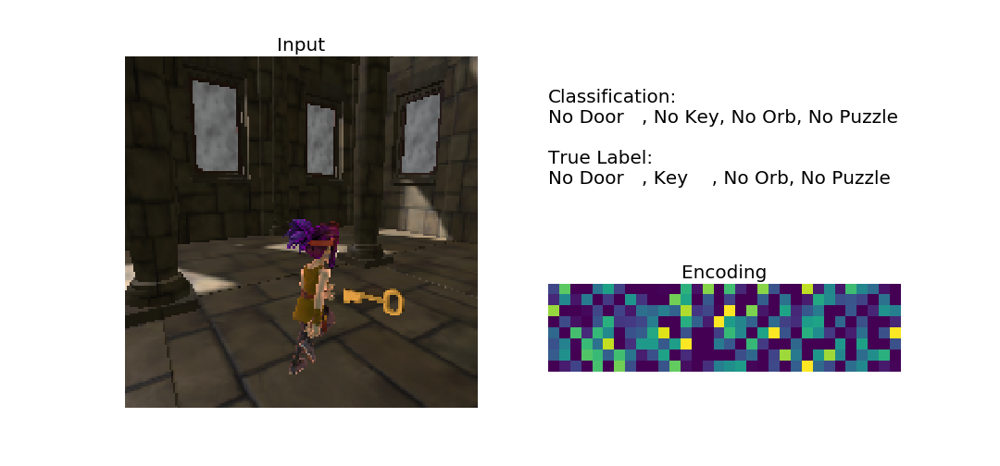

In [87]:
where = np.where((out[:,1]==0)&(fLabels[:,1]==1))
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### False Positive - Orb


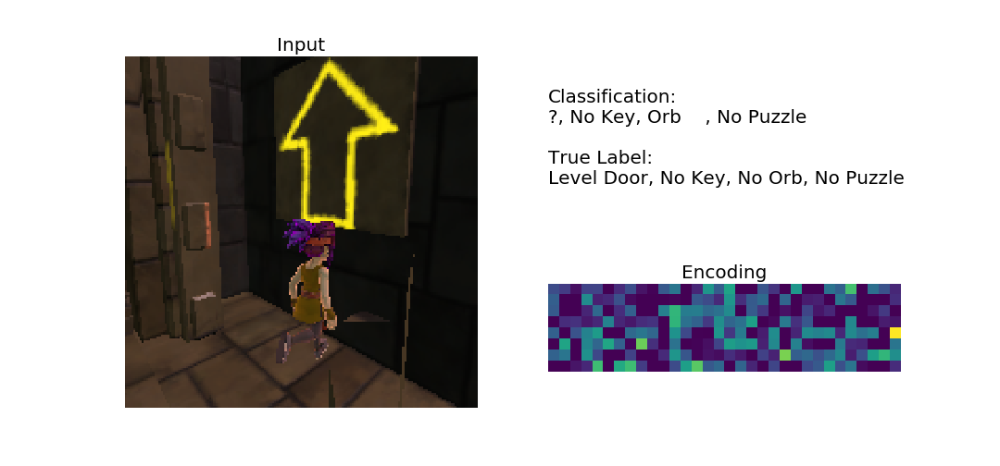
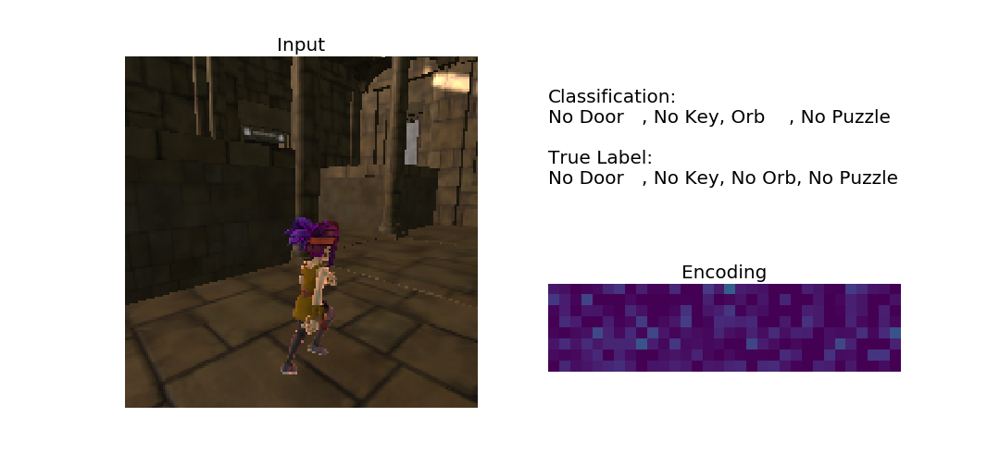
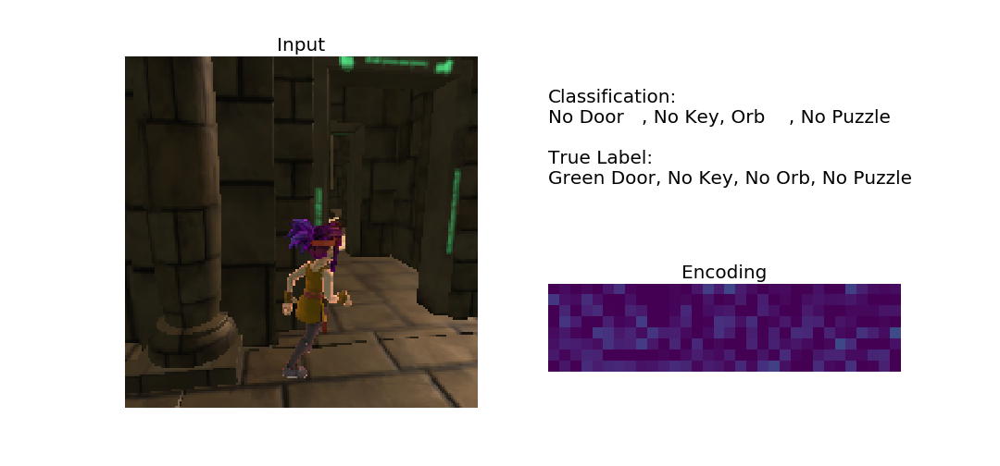
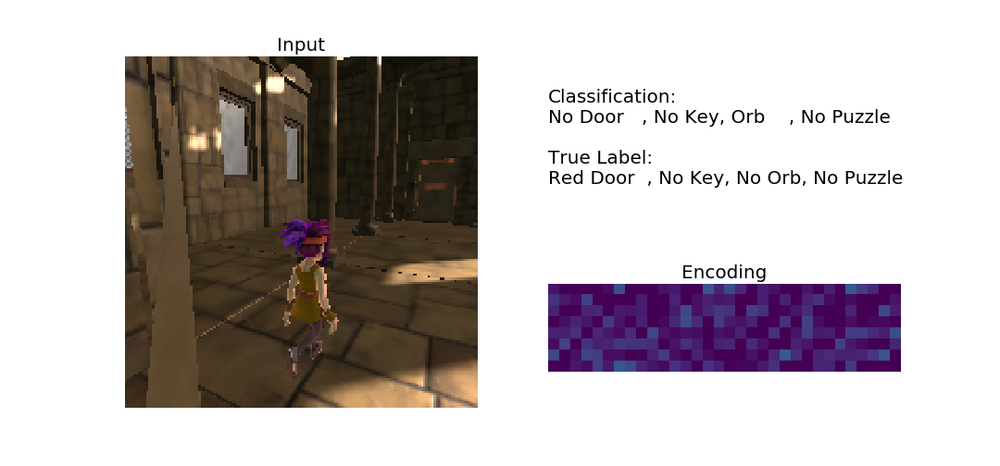
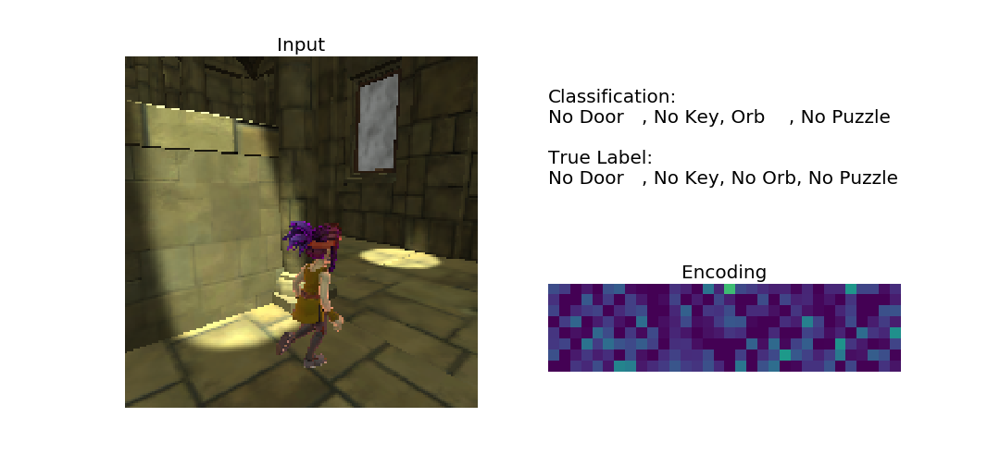
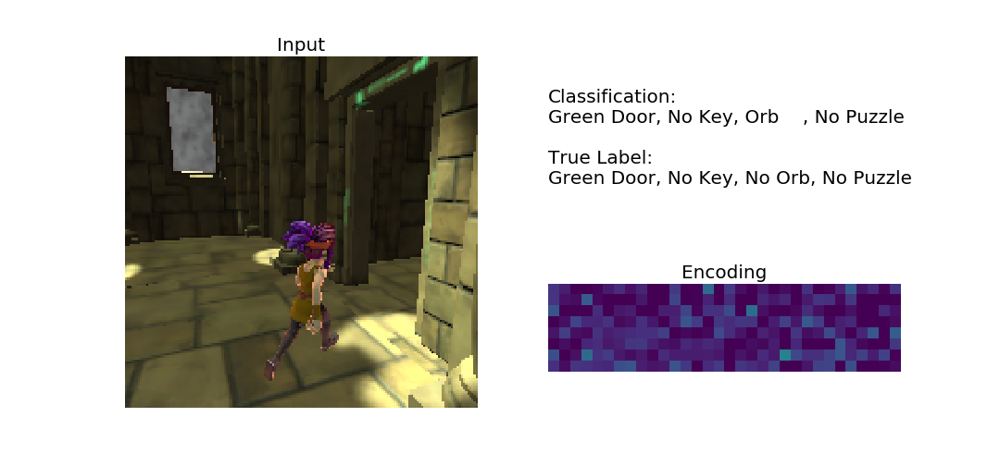
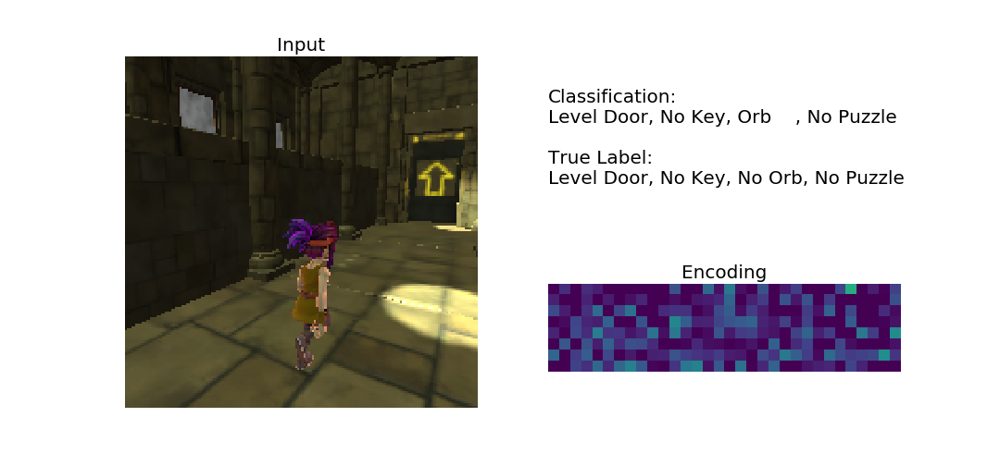
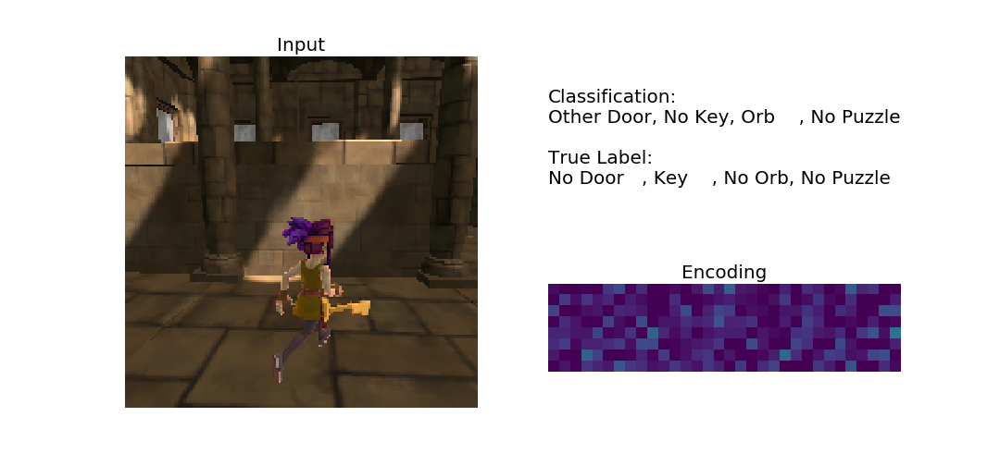
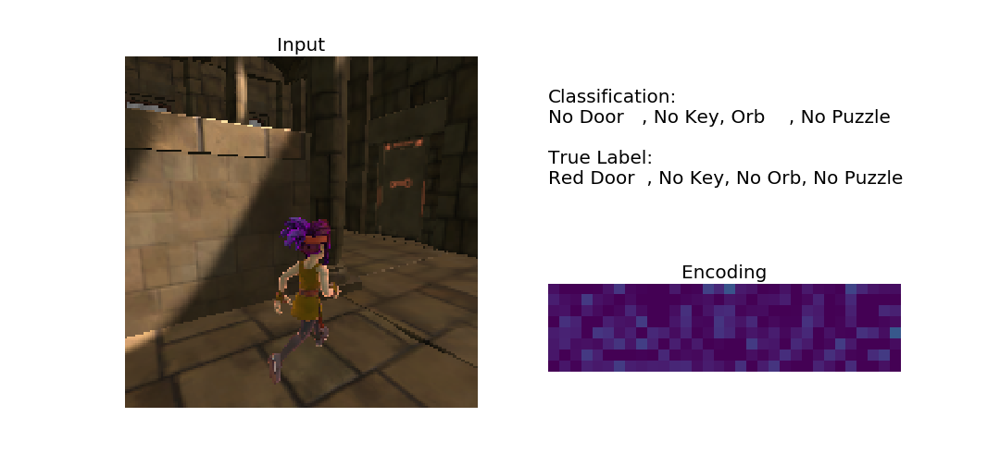
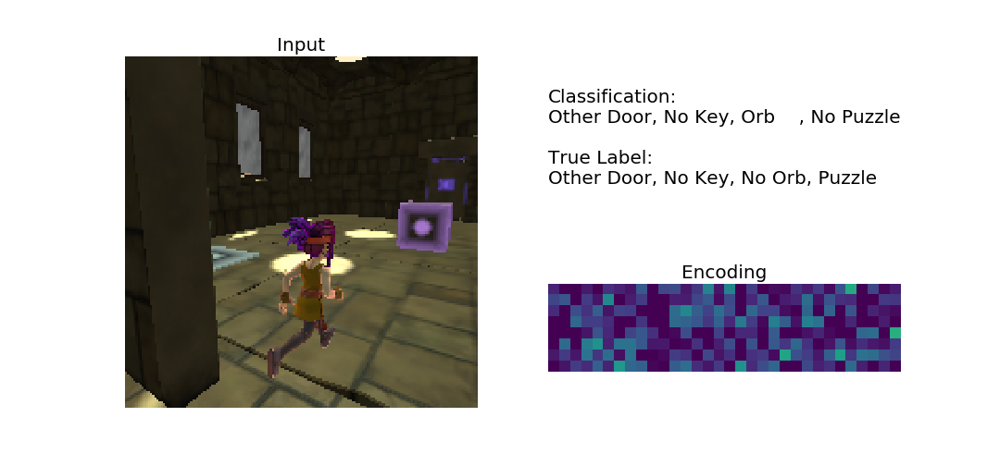

In [91]:
where = np.where((out[:,2]==1)&(fLabels[:,2]==0))
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### False Negative - Orb


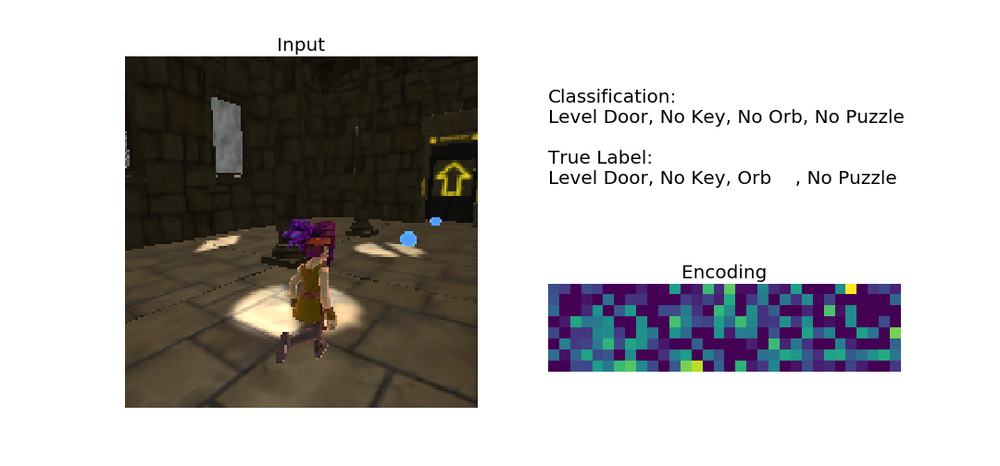
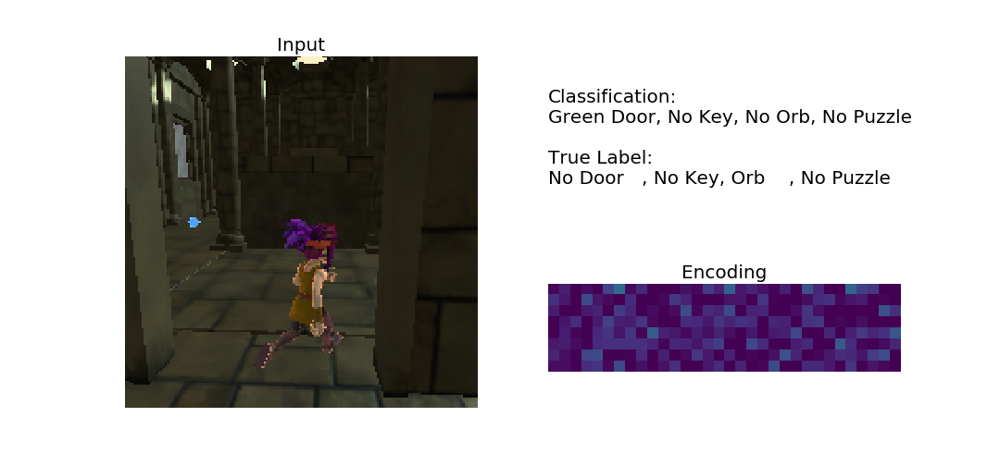
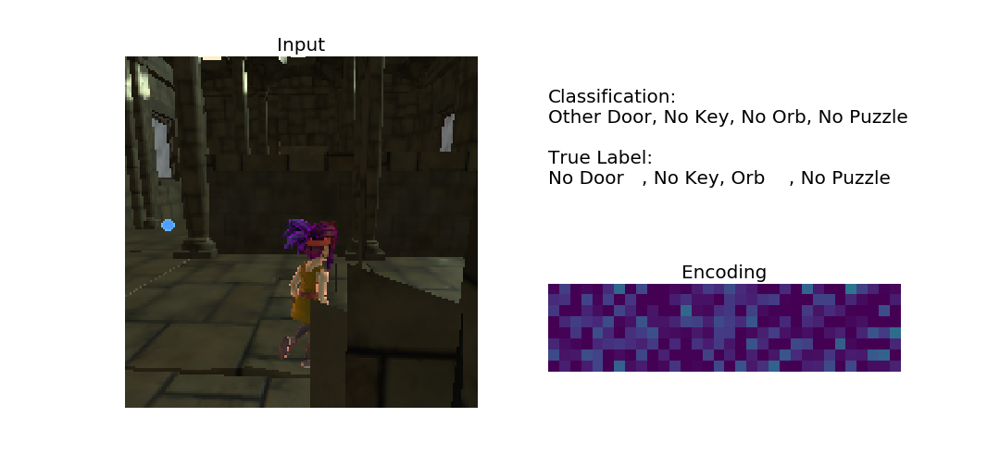
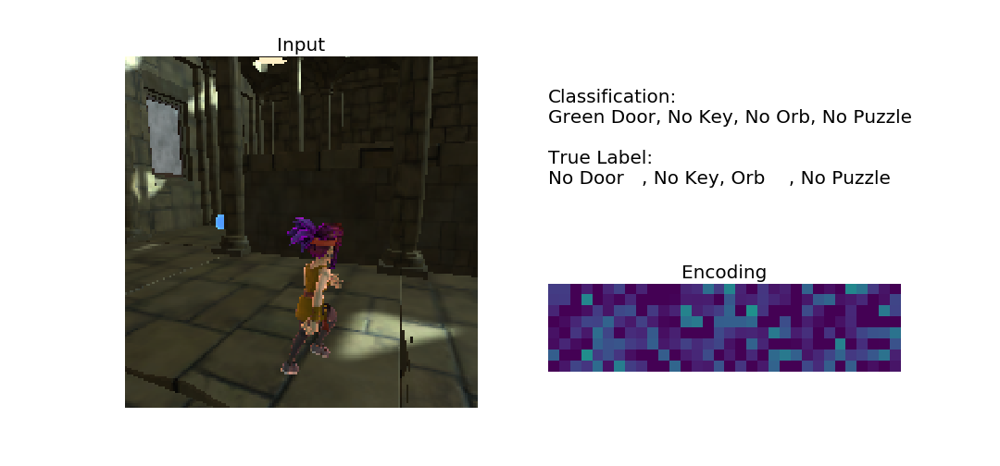
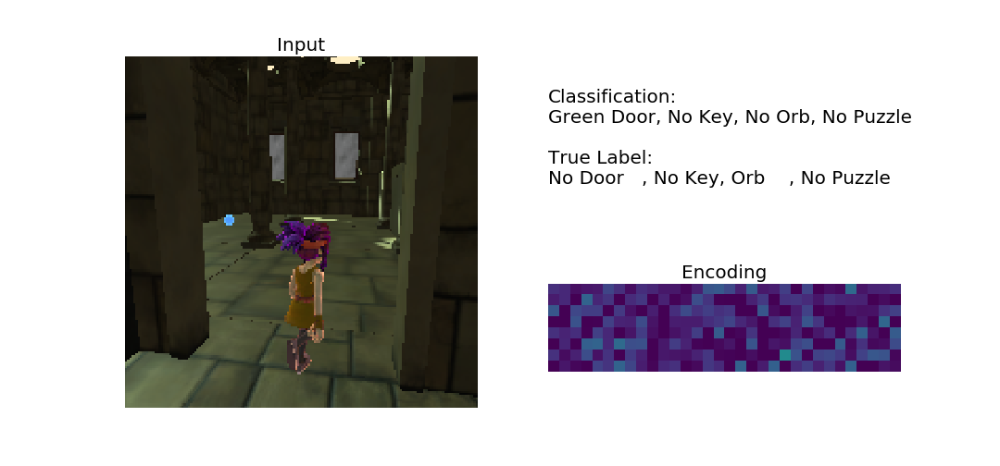
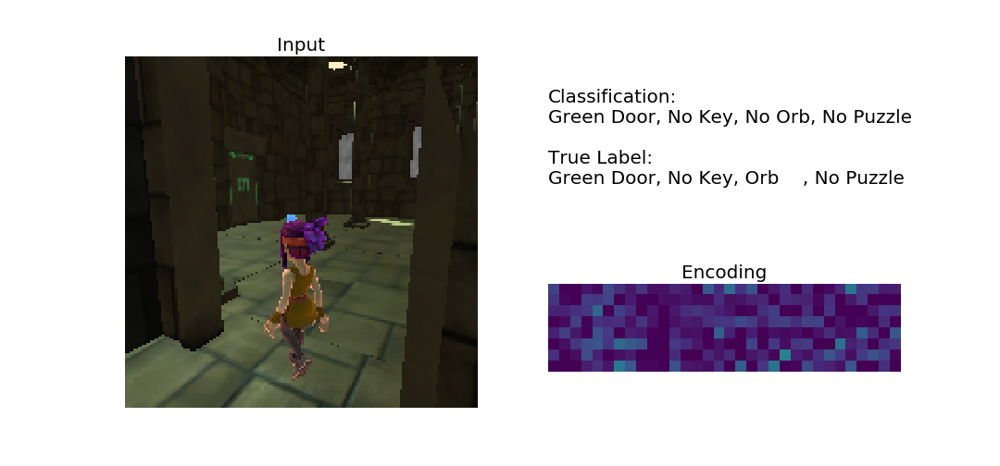
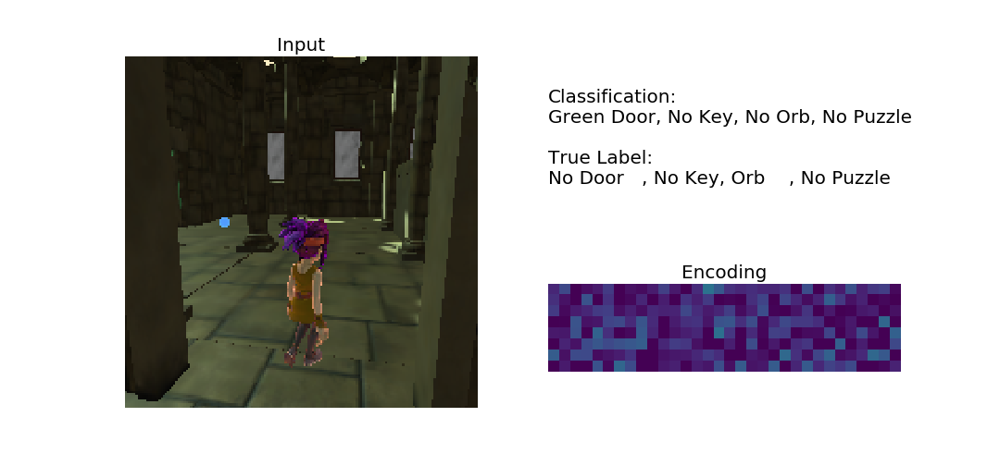
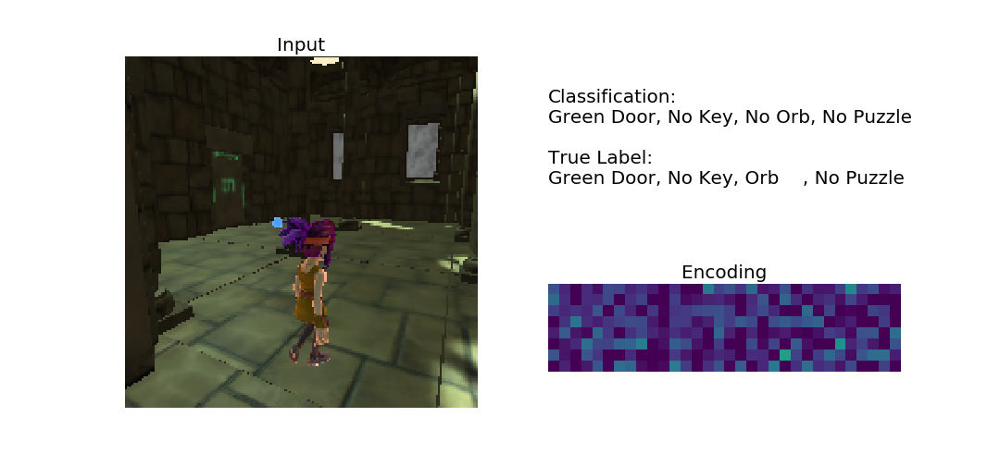
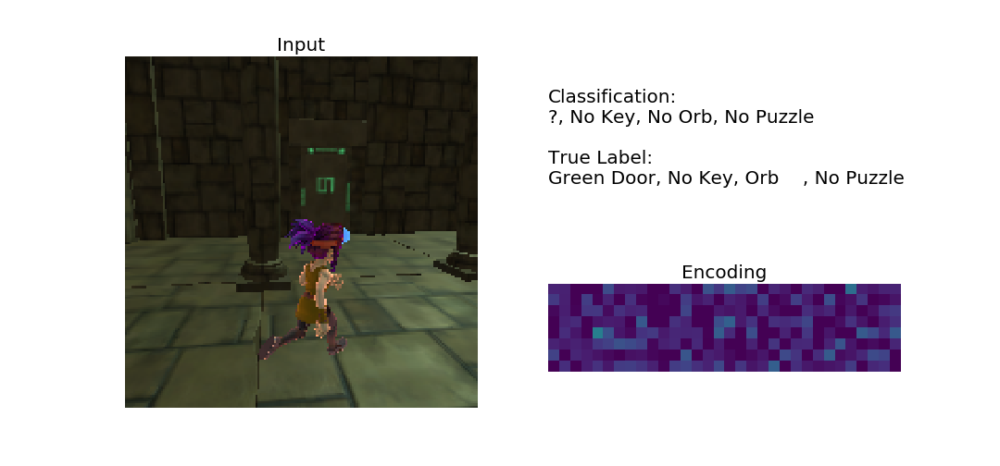
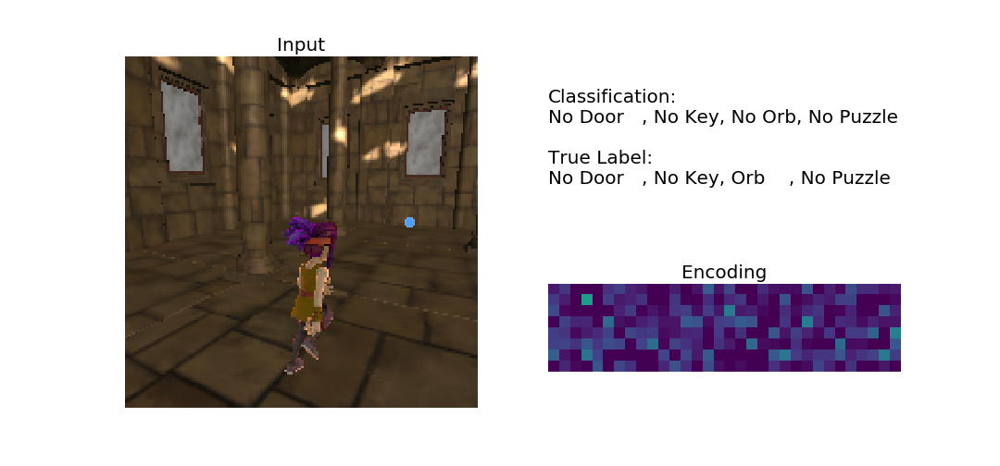

In [92]:
where = np.where((out[:,2]==0)&(fLabels[:,2]==1))
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### False Positive - Puzzle


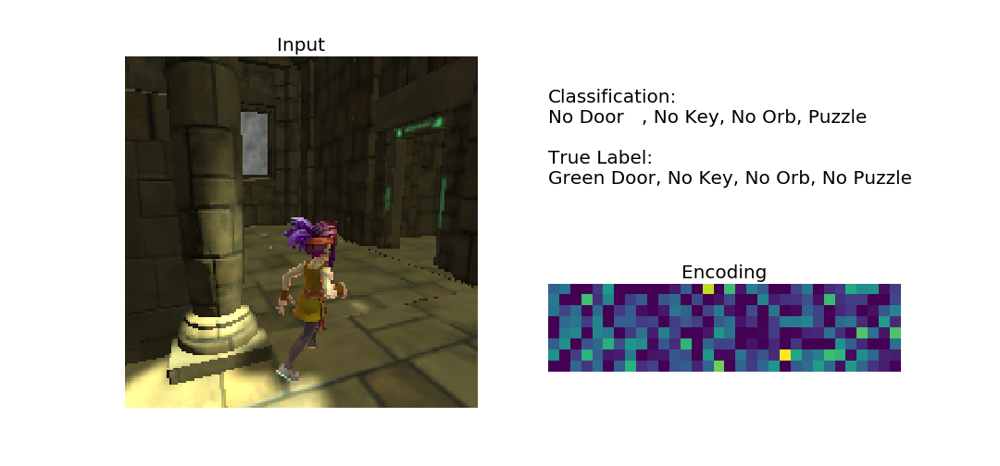
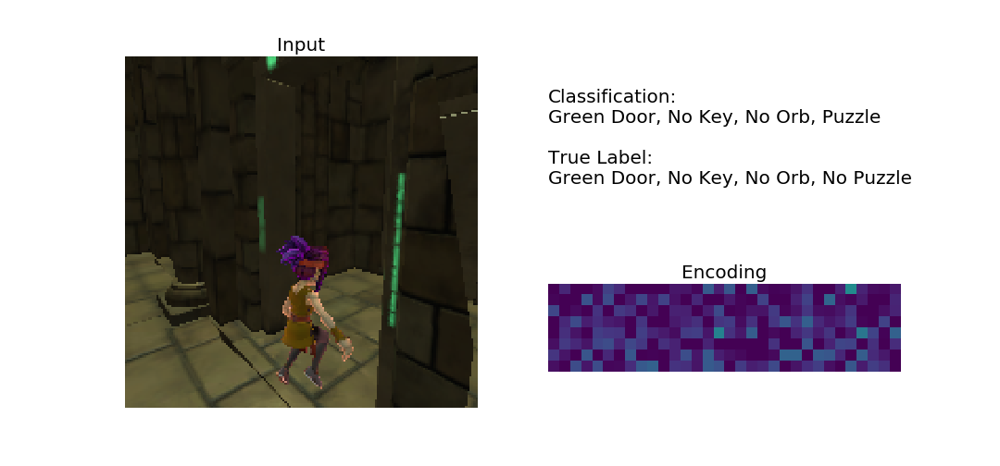
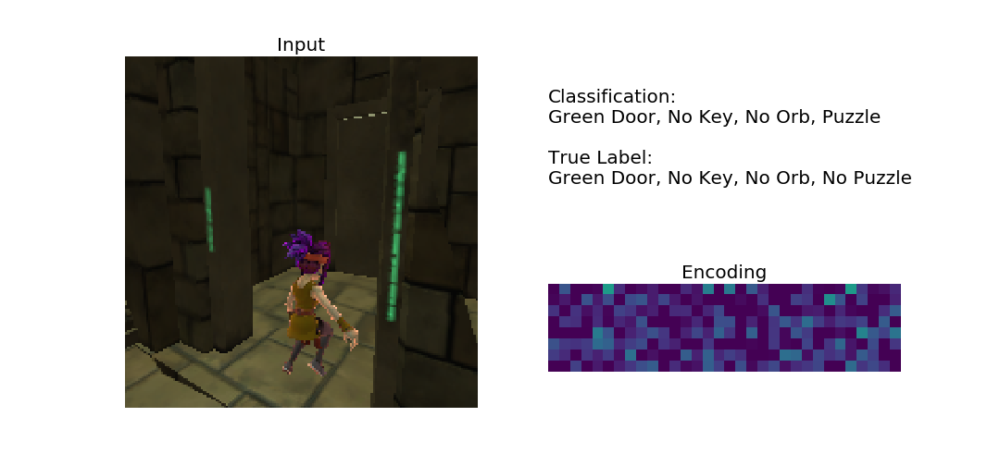
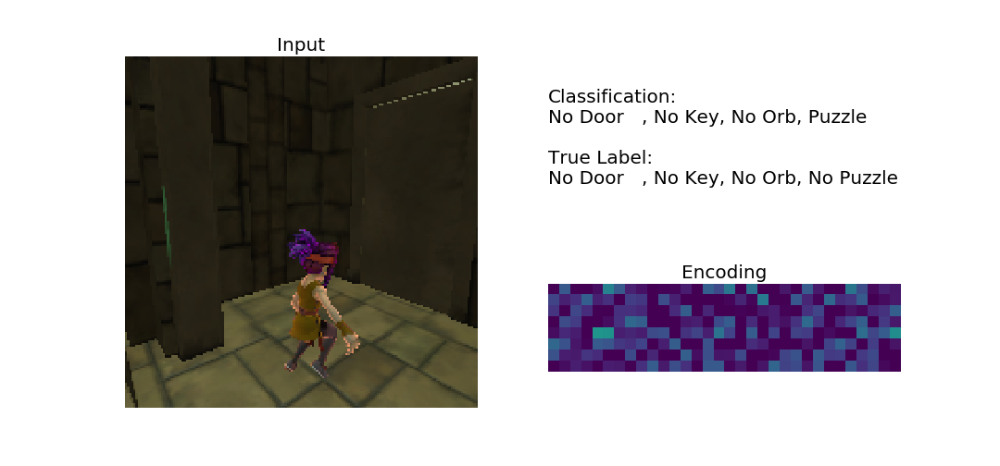
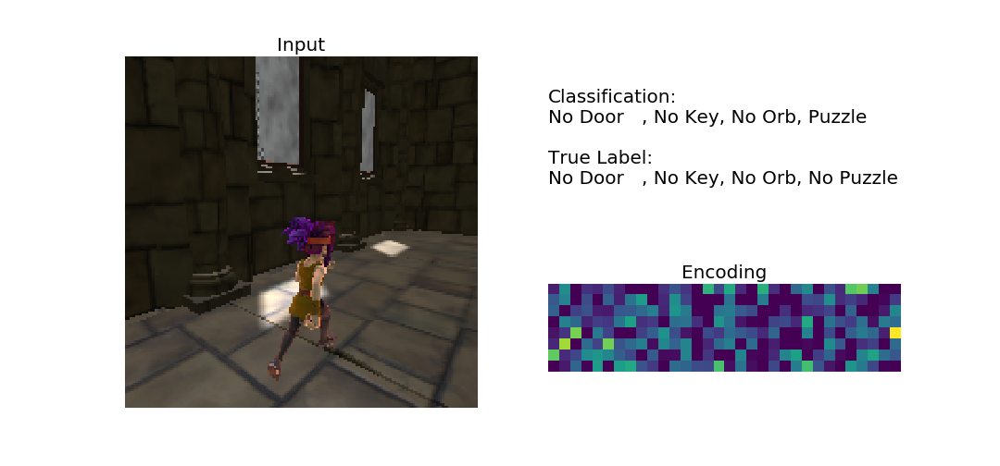
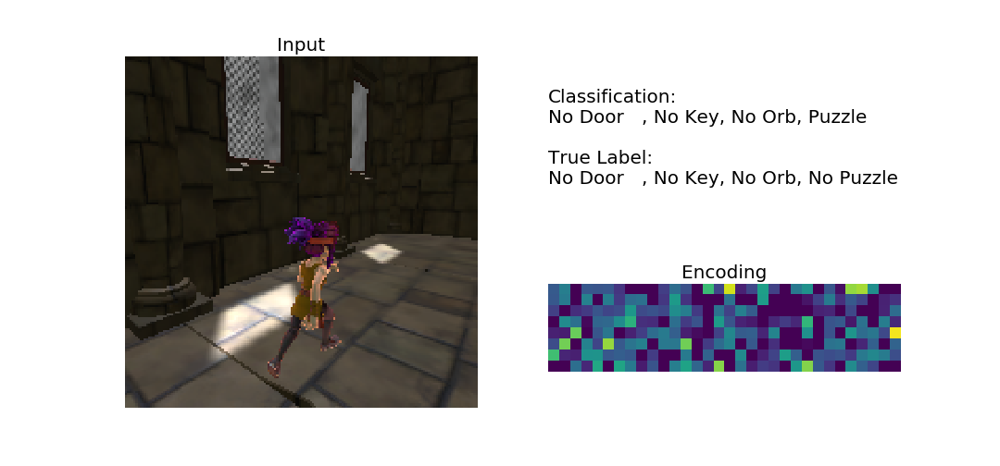
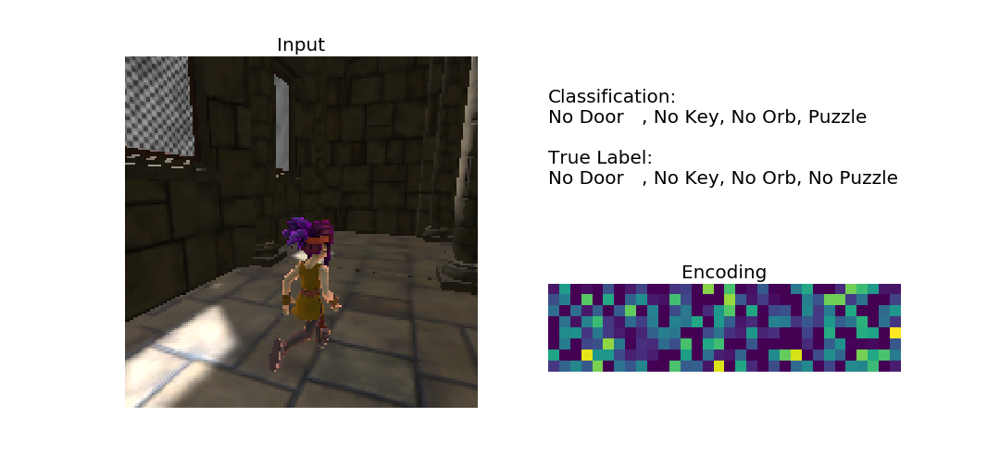
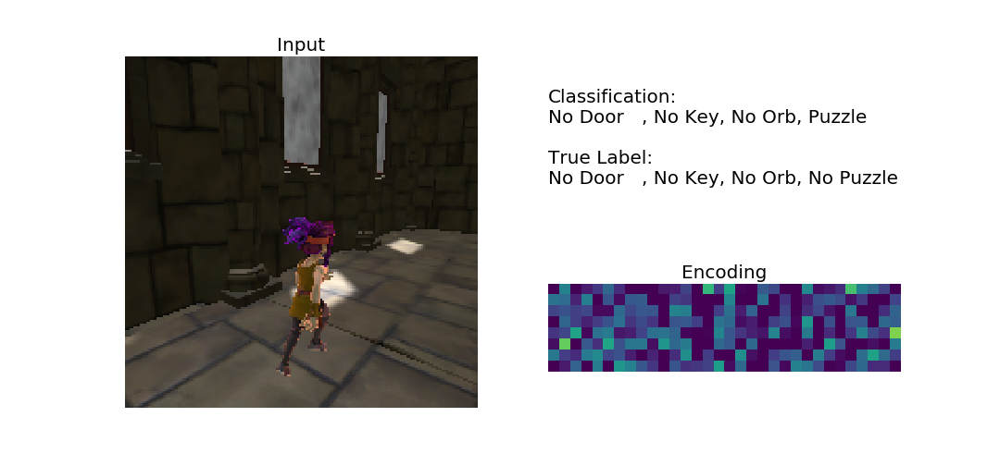
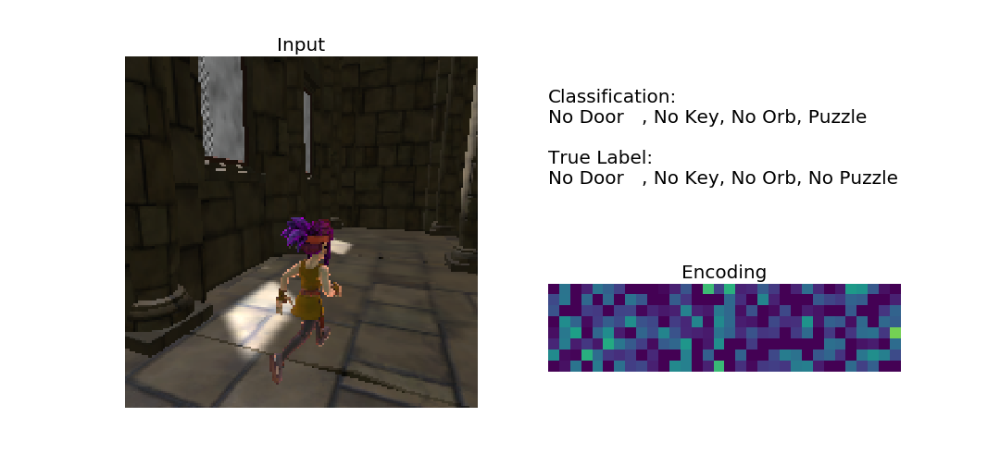
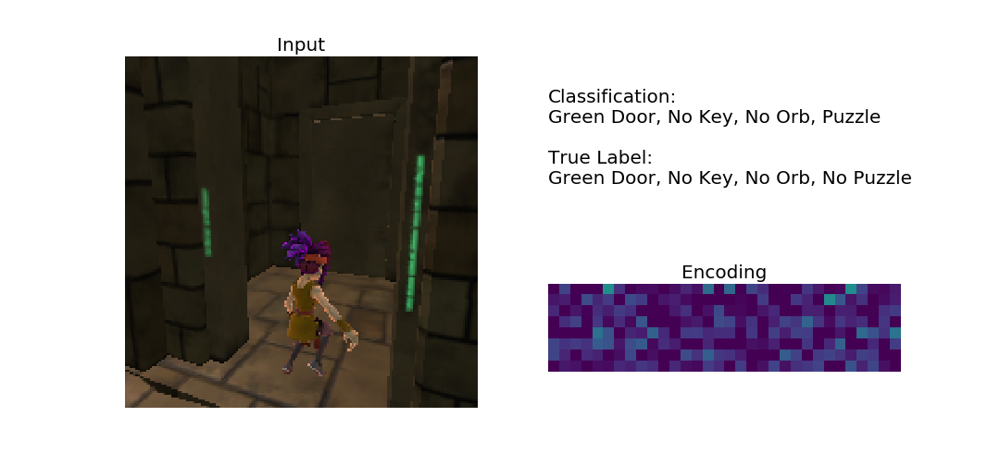

In [93]:
where = np.where((out[:,3]==1)&(fLabels[:,3]==0))
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)

### False Negative - Puzzle


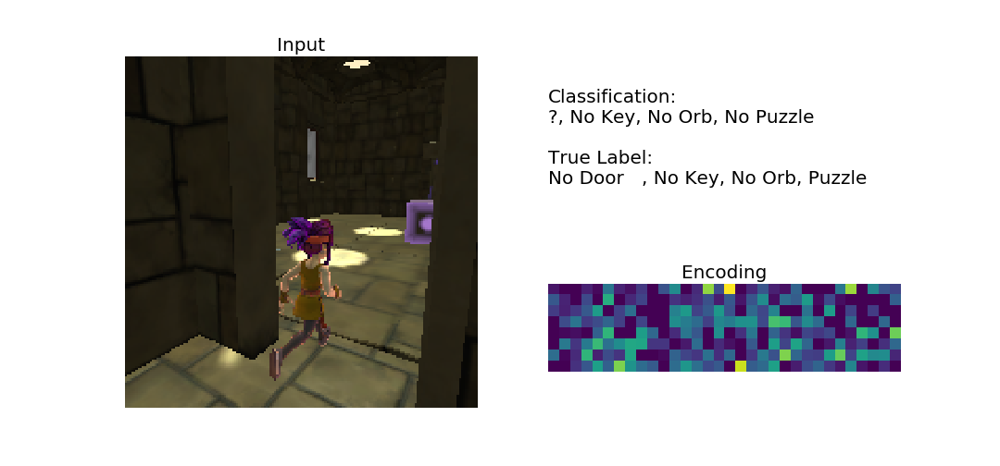
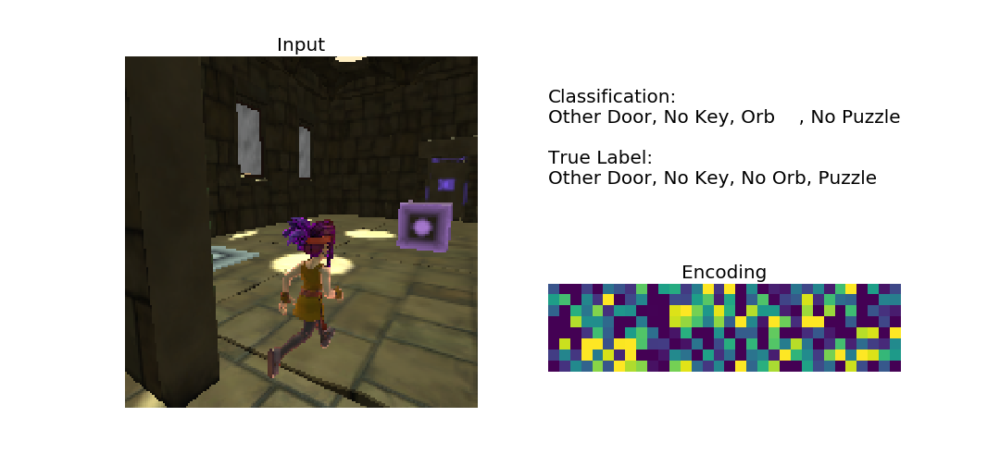
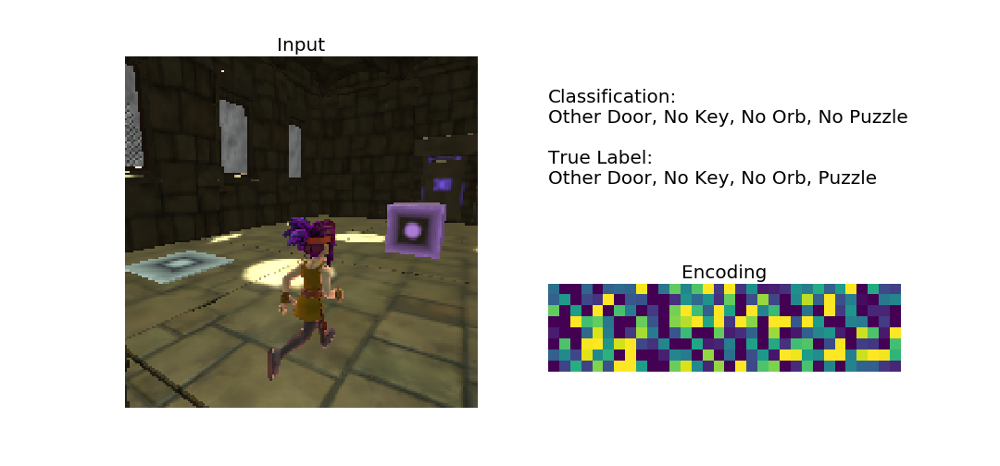
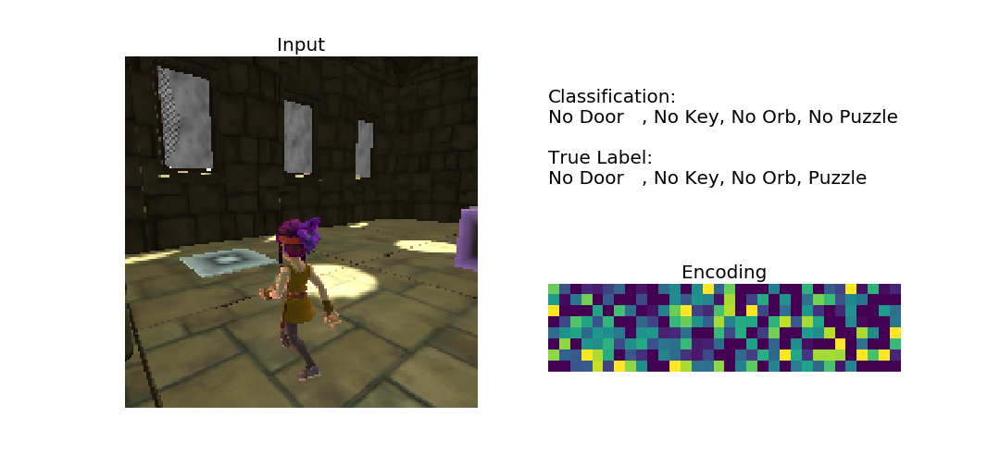
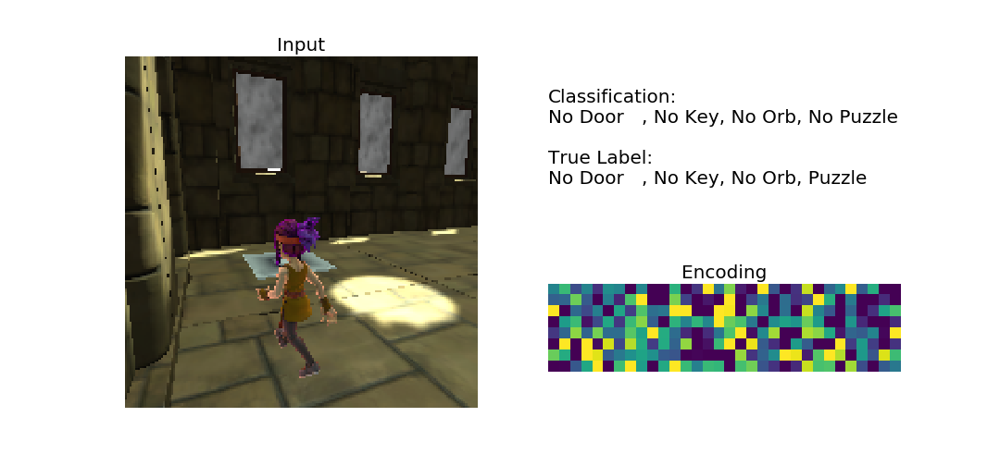
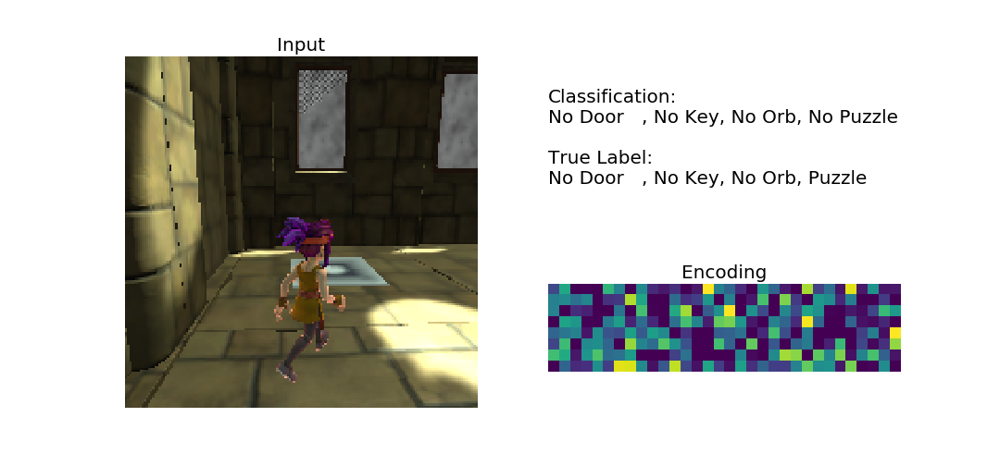
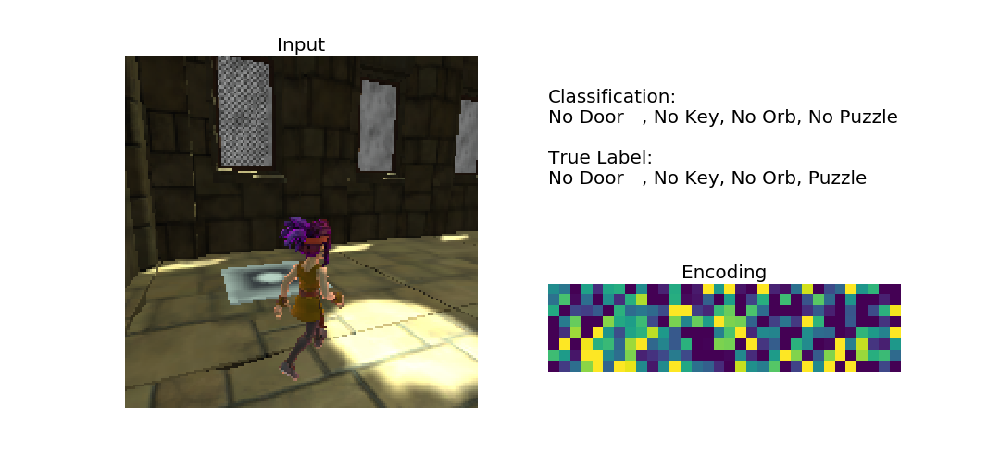
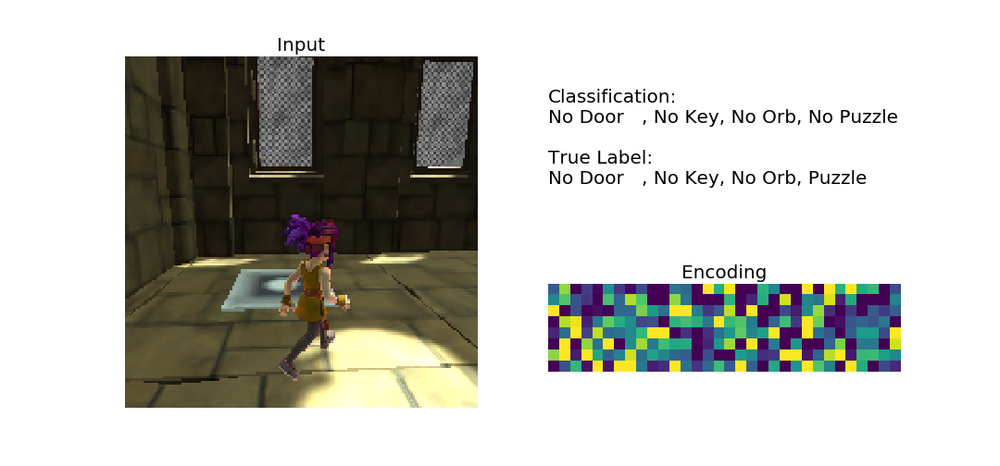
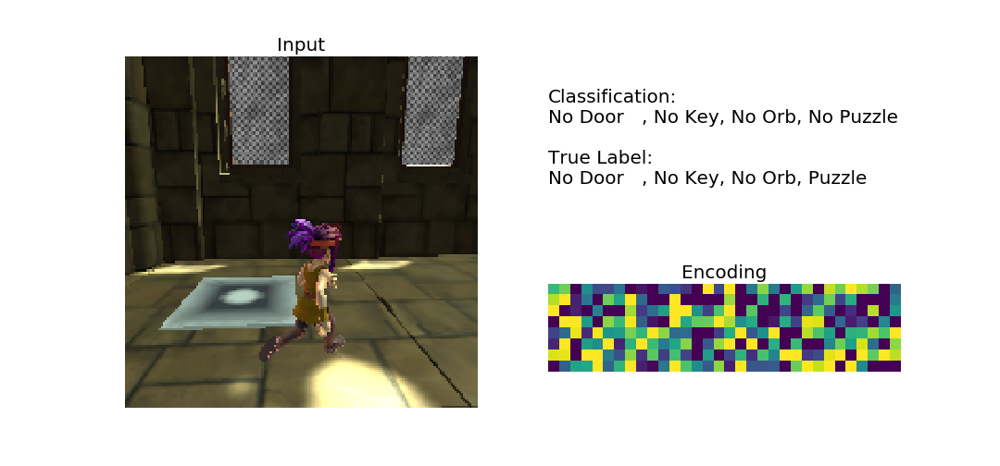
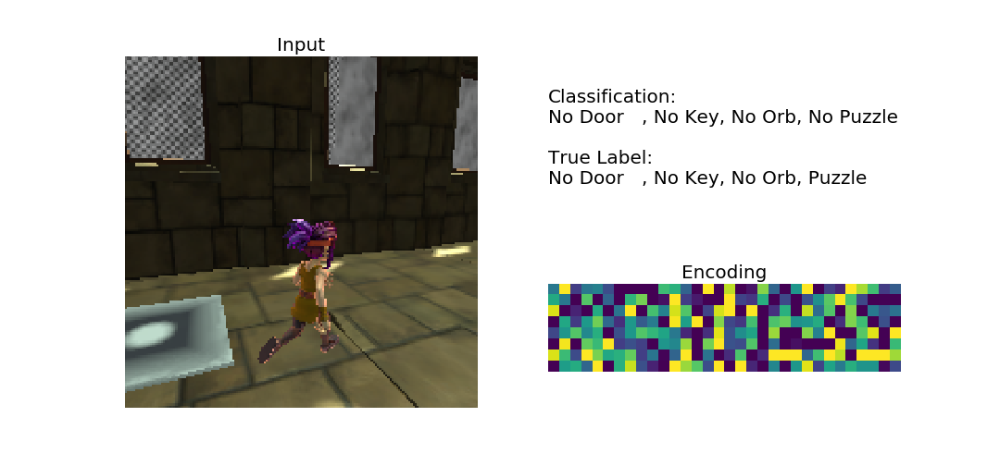

In [94]:
where = np.where((out[:,3]==0)&(fLabels[:,3]==1))
where = where[0]
w = np.array(where[:10])
plot_movie_class(act[w],obs[w],out[w], fLabels[w], save=None)